In [1]:
import numpy as np
from astropy import units as u, constants as const
from matplotlib import pyplot as plt
from scipy.stats import beta
from scipy.special import beta as betafct
from numba import jit, jitclass
from scipy import interpolate
from scipy.interpolate import interp1d
import logging
import sys
import os
sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src')
import importlib
import simulation_strategies, collapse, plotting, utils
importlib.reload(simulation_strategies)
importlib.reload(collapse)
importlib.reload(plotting)
importlib.reload(utils)
from simulation_strategies import *
from collapse import *
from plotting import *
from utils import *
import cProfile
import pstats

In [2]:
def my_mpl():
    plt.rc('font', family='serif', size=20)
    plt.rc('axes', grid=True)
    plt.rc('lines', lw=3)
    ts = 8
    plt.rc('xtick.minor', size=ts-2)
    plt.rc('ytick.minor', size=ts-2)
    plt.rc('xtick.major', size=ts)
    plt.rc('ytick.major', size=ts)
    plt.rc('figure', figsize=[12, 9])
my_mpl()
logging.basicConfig(level=logging.DEBUG,
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [3]:
r_max = 2
N = 20
np.linspace(r_max/N, r_max, N)

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ])

In [4]:
t_i = 1
G = 1
rho_H = 1/(6*np.pi*G*t_i**2)
theta_vals = np.linspace(0, 2*np.pi, 1000)

def delta_m(m_pert):
    return m_pert / (4*np.pi*rho_H)
def lambda_theta(theta):
    # Add small epsilon to avoid division by zero
    eps = 1e-10
    return 0.5*(1-np.cos(theta))*((theta-np.sin(theta) + eps)/np.pi)**(-8/9)
# Create theta_vals and corresponding lambda_vals
theta_vals = np.linspace(1e-6, 2*np.pi, 1000)
lambda_vals = lambda_theta(theta_vals)

# Create the inverse mapping (lambda -> theta)
theta_lambda = interp1d(lambda_vals, theta_vals, bounds_error=False, fill_value=np.nan)
def r_ta(r_i, m_pert):
    return r_i**4 / (3*delta_m(m_pert))
def t_ta(r_i, m_pert, H):
    return np.pi*r_i**(9/2) / (6*np.sqrt(3)*H*delta_m(m_pert)**(3/2))
def r_theta(r_i, m_pert, theta):
    return r_ta(r_i, m_pert)/2 * (1-np.cos(theta))
def t_theta(r_i, m_pert, H, theta):
    return t_ta(r_i, m_pert, H)/np.pi * (theta-np.sin(theta))
def theta_t(r_i, m_pert, H, t):
    return interp1d(theta_vals, t_theta(r_i, m_pert, H, theta_vals), fill_value=0)(t)
def v_lambda(lam):
    theta = theta_lambda(lam)
    return lam * (np.sin(theta)*(theta-np.sin(theta)))/(1-np.cos(theta))**2
def tau(t, t_i):
    return t_i + t/t_i
def shifted_t(t, t_i):
    return t + t_i
def r_cta(t, m_pert, H):
    return (1/3)*(6*np.sqrt(3)*H/np.pi)**(8/9) * delta_m(m_pert)**(1/3) * (shifted_t(t, t_i))**(8/9)
def lambda_rt(r, t, m_pert, H):
    return r / r_cta(t, m_pert, H)
def m_lambda(lam, H):
    theta = theta_lambda(lam)
    return lam**3 * (2/H**2) * (theta-np.sin(theta))**2/(1-np.cos(theta))**3
def d_lambda(lam, H):
    return m_lambda(lam, H)/lam**3 * 1/(4-(9/2)*v_lambda(lam)/lam)
def rho_H_t(t):
    return rho_H * (1+t/t_i)**(-2)
def m_from_results(t, m_enc, m_pert, H):
    return m_enc / (4/3 * np.pi * rho_H_t(t) * r_cta(t, m_pert, H)**3)
def d_from_results(t, m_shell, r_shell, r_prev_shell):
    vol_shell = 4/3 * np.pi * (r_shell**3 - r_prev_shell**3)
    return (m_shell/vol_shell) / rho_H_t(t)


In [5]:
np.linspace(0.515, 2, 100)

array([0.515, 0.53 , 0.545, 0.56 , 0.575, 0.59 , 0.605, 0.62 , 0.635,
       0.65 , 0.665, 0.68 , 0.695, 0.71 , 0.725, 0.74 , 0.755, 0.77 ,
       0.785, 0.8  , 0.815, 0.83 , 0.845, 0.86 , 0.875, 0.89 , 0.905,
       0.92 , 0.935, 0.95 , 0.965, 0.98 , 0.995, 1.01 , 1.025, 1.04 ,
       1.055, 1.07 , 1.085, 1.1  , 1.115, 1.13 , 1.145, 1.16 , 1.175,
       1.19 , 1.205, 1.22 , 1.235, 1.25 , 1.265, 1.28 , 1.295, 1.31 ,
       1.325, 1.34 , 1.355, 1.37 , 1.385, 1.4  , 1.415, 1.43 , 1.445,
       1.46 , 1.475, 1.49 , 1.505, 1.52 , 1.535, 1.55 , 1.565, 1.58 ,
       1.595, 1.61 , 1.625, 1.64 , 1.655, 1.67 , 1.685, 1.7  , 1.715,
       1.73 , 1.745, 1.76 , 1.775, 1.79 , 1.805, 1.82 , 1.835, 1.85 ,
       1.865, 1.88 , 1.895, 1.91 , 1.925, 1.94 , 1.955, 1.97 , 1.985,
       2.   ])

In [6]:
def compute_r0_min(r_min, r_max, N):
    """
    Compute r0_min such that the spacing dR in np.linspace(r0_min, r_max, N)
    satisfies dR = r0_min - r_min.
    
    Parameters:
    - r_min (float): The minimum radius.
    - r_max (float): The maximum radius.
    - N (int): Number of points.
    
    Returns:
    - float: The computed r0_min.
    """
    return (r_max + r_min * (N - 1)) / N
r_min = 0.5
r_max = 1
N = 2
r0_min = compute_r0_min(r_min, r_max, N)
print(r0_min)

0.75


In [11]:
# cosmological parameters
delta_i = 1e-1
density_strategy = 'background_plus_tophat'
tophat_radius = 1
m_pert = rho_H * delta_i * 4/3 * np.pi * tophat_radius**3
H = 2/(3*t_i)

j_coef, ang_mom_strategy, r_ta_strategy = 0, 'zero', 'tophat_pert_r_ta'

# simulation "hand-picked" parameters
eps = 1e9
N = 2
r_max = 1
softlen, thickness = 0, 0
safety, dt_min, save_dt, timescale_strategy, save_strategy, stepper = 1e-4, 1e-6, 1e-3, 'dyn', 'vflip', 'beeman'
deque_size = 1
soft_func_strategy, energy_strategy, accel_strategy = 'const_soft', 'kin_grav_rot', 'grant_gmr_j_at_r_ta_soft_all'
r_min_strategy, r_min = 'reflect', 0.1
r0_min = compute_r0_min(r_min, r_max, N)
r0_strategy, r0_min = 'r0min_start_equal', r0_min
m_enc_strategy = 'overlap_inclusive'
shell_volume_strategy = 'inner_not_zero'
point_mass = 4/3 * np.pi * r_min**3 * rho_H * (1+delta_i)
save_filename = None

# simulation derived parameters
t_max = 2*t_ta(r_max, m_pert, H)
print(f't_max = {t_max:.2e}')
t_max = 200
# tophat black hole config
th_bh_config = {
    'shell_volume_strategy': shell_volume_strategy,
    'point_mass': point_mass,
    'softlen': softlen,
    'density_strategy': density_strategy,
    'tophat_radius': tophat_radius,
    'initial_radius_strategy': r0_strategy,
    'r0_min': r0_min,
    'rho_bar': rho_H,
    'safety_factor': safety,
    'thickness_coef': thickness,
    'j_coef': j_coef,
    'ang_mom_strategy': ang_mom_strategy,
    'r_ta_strategy': r_ta_strategy,
    'energy_strategy': energy_strategy,
    'accel_strategy': accel_strategy,
    't_max': t_max,
    'dt_min': dt_min,
    'N': N,
    'r_min': r_min,
    'r_min_strategy': r_min_strategy,
    'H': H,
    'r_max': r_max,
    'm_pert': m_pert, 
    'stepper_strategy': stepper,
    'timescale_strategy': timescale_strategy,
    'm_enc_strategy': m_enc_strategy,
    'save_strategy': save_strategy,
    'save_dt': save_dt,
    'deque_size': deque_size,
    'save_filename': save_filename,
    'show_progress': True,
}

# tophat black hole config
th_bh_config2 = {
    'softlen': softlen,
    'density_strategy': 'const',
    'initial_radius_strategy': r0_strategy,
    'r0_min': r0_min,
    'tophat_radius': 0,
    'rho_bar': rho_H,
    'point_mass': m_pert,
    'safety_factor': safety,
    'thickness_coef': thickness,
    'j_coef': j_coef,
    'ang_mom_strategy': ang_mom_strategy,
    'r_ta_strategy': 'tophat_point_mass_r_ta',
    'energy_strategy': energy_strategy,
    'accel_strategy': accel_strategy,
    't_max': t_max,
    'dt_min': dt_min,
    'N': N,
    'r_min': r_min,
    'r_min_strategy': r_min_strategy,
    'H': H,
    'r_max': r_max,
    'm_pert': 4/3 * np.pi * r_max**3 * rho_H, 
    'stepper_strategy': stepper,
    'timescale_strategy': timescale_strategy,
    'm_enc_strategy': m_enc_strategy,
    'save_strategy': save_strategy,
    'save_dt': save_dt,
    'deque_size': deque_size,
    'save_filename': save_filename,
}

t_max = 1.49e+02


In [12]:
config = th_bh_config
do_point_mass = False
if do_point_mass:
    config = th_bh_config2
    tophat_radius = 0
x = SphericalCollapse(config)
profile = False
if profile:
    # Profile the run method
    profiler = cProfile.Profile()
    profiler.enable()
    results = x.run()
    profiler.disable()

    # Print the profiling results
    stats = pstats.Stats(profiler).sort_stats('cumulative')
    stats.print_stats(20)  # Print top 20 time-consuming functions
else:
    results = x.run()

2024-12-16 17:54:21,036 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/collapse.py:376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return {key: np.array(value) for key, value in results.items()}


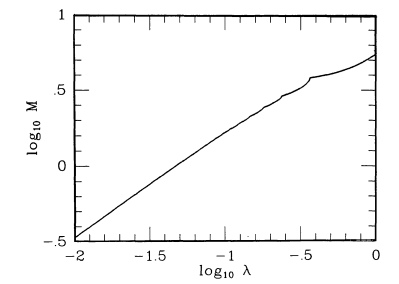

Processing file: sim_N50_rmax2_delta0.1_rmin1.h5
Processing file: sim_N100_rmax2_delta0.1_rmin1.h5
Processing file: sim_N50_rmax2_delta0.1_rmin0.8.h5
Processing file: sim_N100_rmax2_delta0.1_rmin0.8.h5
Processing file: sim_N200_rmax2_delta0.1_rmin1.h5
Processing file: sim_N50_rmax2_delta0.1_rmin0.5.h5
Processing file: sim_N200_rmax2_delta0.1_rmin0.8.h5
Processing file: sim_N100_rmax2_delta0.1_rmin0.5.h5
Processing file: sim_N200_rmax2_delta0.1_rmin0.5.h5
Processing file: sim_N50_rmax3_delta0.1_rmin0.8.h5
Processing file: sim_N100_rmax3_delta0.1_rmin1.h5
Processing file: sim_N100_rmax3_delta0.1_rmin0.8.h5
Processing file: sim_N50_rmax3_delta0.1_rmin0.5.h5


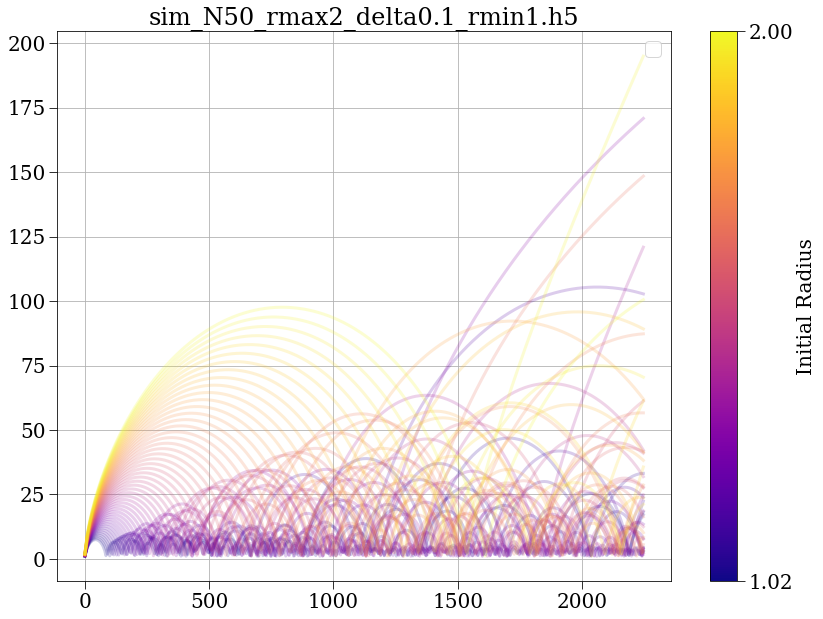

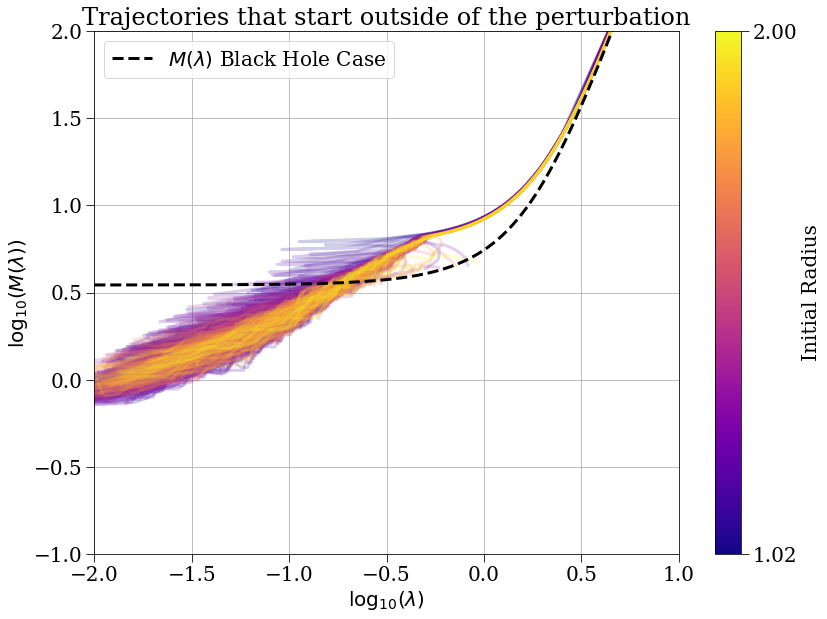

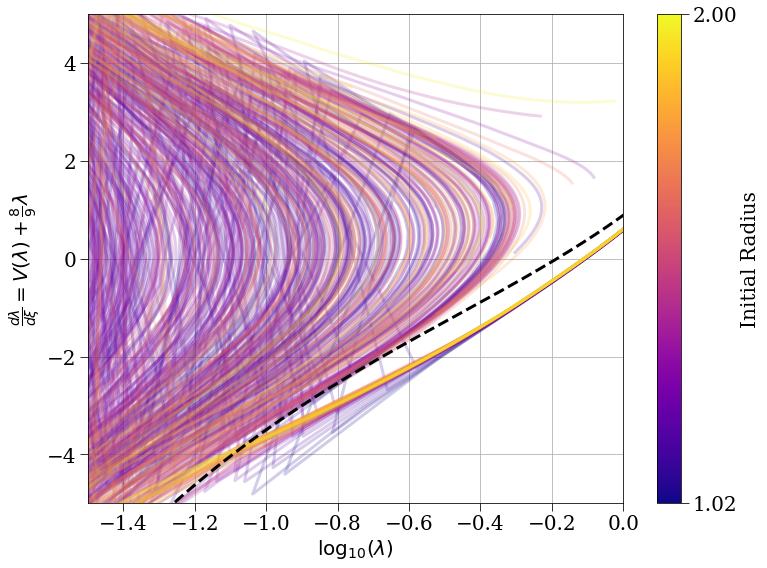

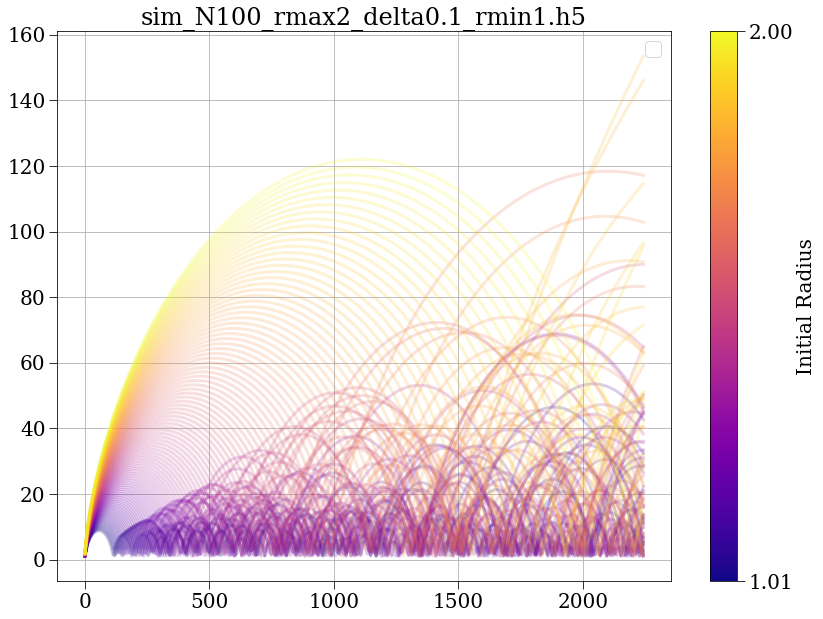

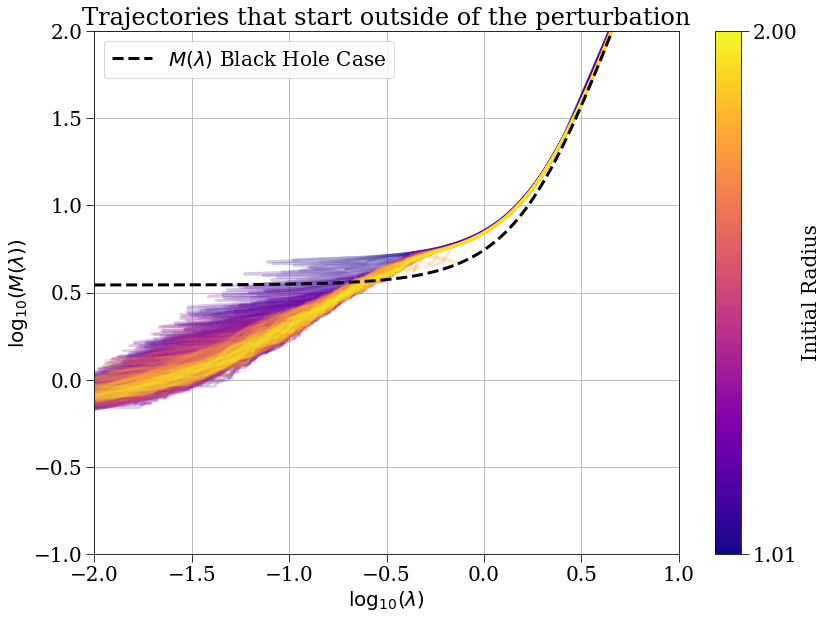

...

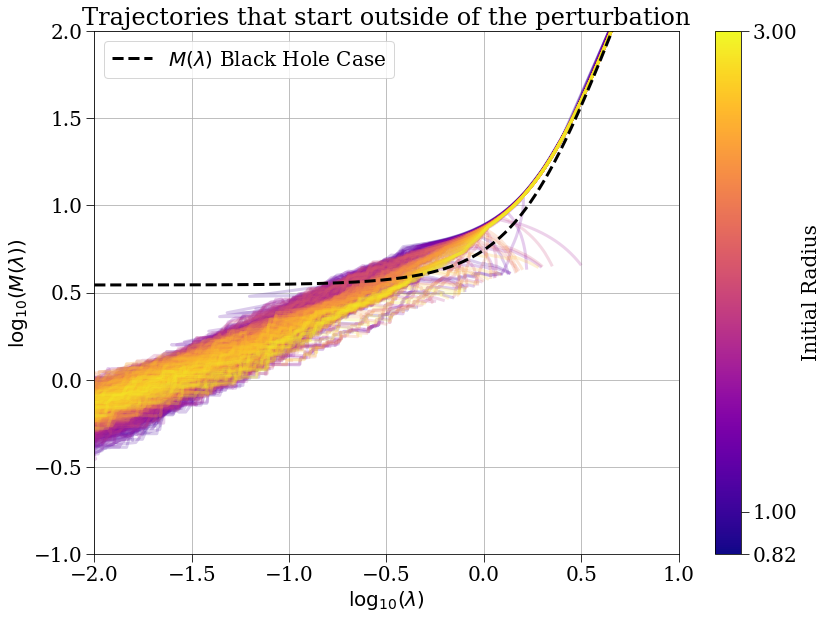

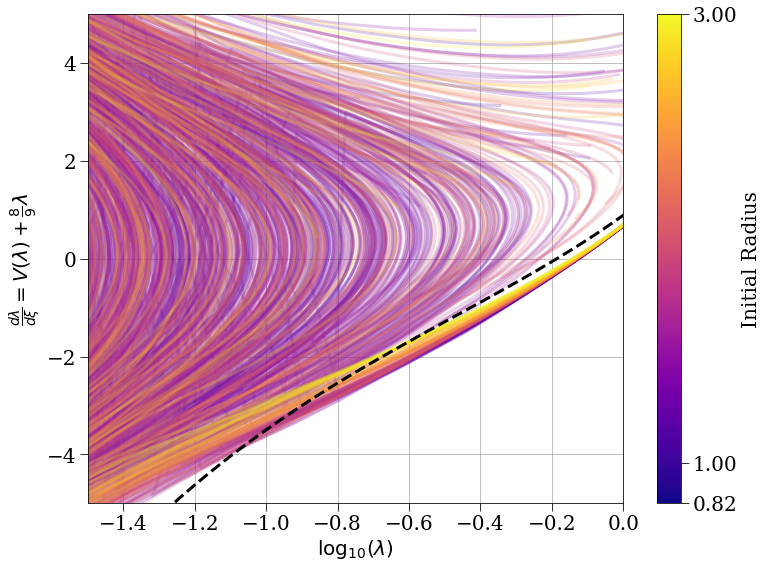

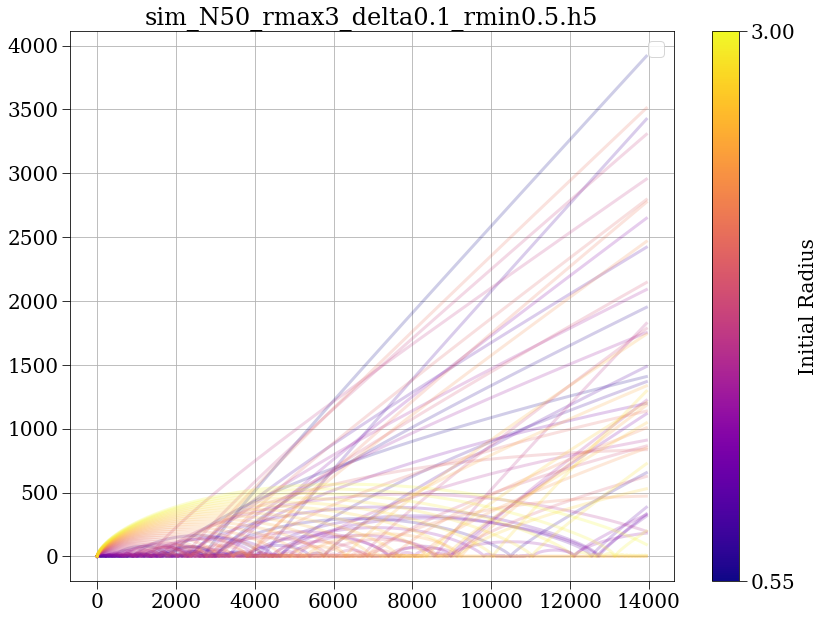

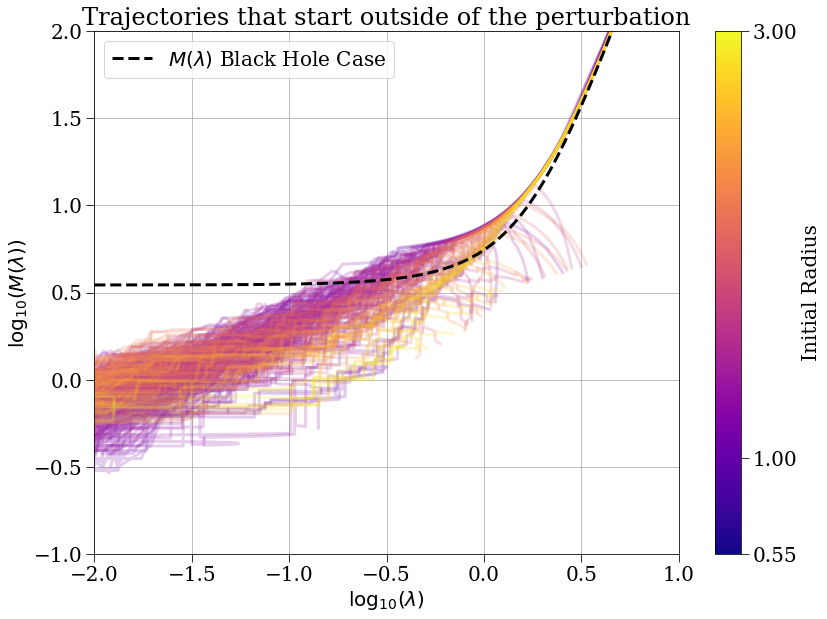

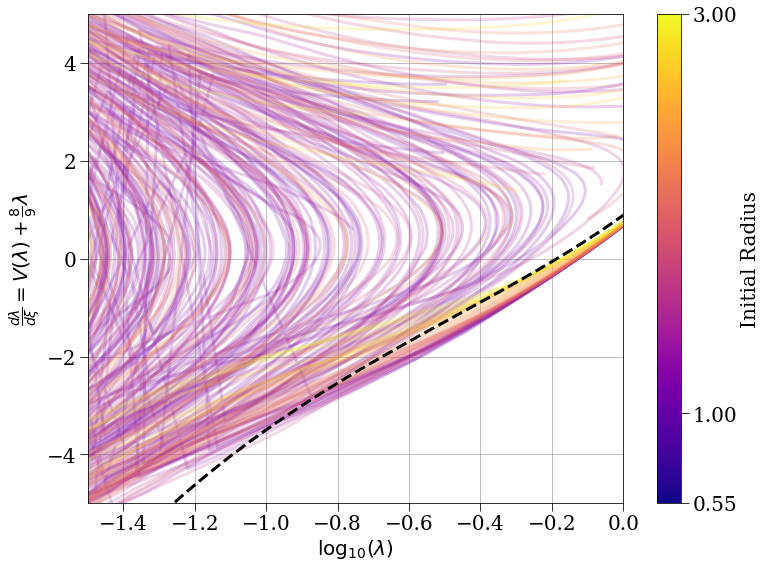

<Figure size 864x648 with 0 Axes>

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
# Assuming load_simulation_data, lambda_rt, m_from_results, m_lambda are defined elsewhere

src_dir = '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/runs'

# Choose a colormap
cmap = plt.cm.plasma  # You can experiment with other colormaps like 'viridis', 'magma', etc.

# Ignore warning for opening too many figures
plt.rcParams.update({'figure.max_open_warning': 0})

for file in os.listdir(src_dir):
    if file.endswith('.h5') and "delta0.1" in file:
        print(f"Processing file: {file}")
        file_path = os.path.join(src_dir, file)
        try:
            # Load the simulation data
            params, results = load_simulation_data(file_path)
            tophat_radius = 1
            m_pert = params['m_pert']
            H = 2/3
            G = 1
            N = params['N']

            # Extract initial radii
            initial_radii = results['r'][0, :]  # First time step for all shells
            r_min, r_max = initial_radii.min(), initial_radii.max()

            # Define normalization based on initial radii
            norm = plt.Normalize(r_min, r_max)

            # Plot all shells with color based on initial radii
            for idx in range(N):
                t, r = results['t'], results['r'][:, idx]
                r_initial = initial_radii[idx]
                plt.plot(t, r, color=cmap(norm(r_initial)), alpha=0.2)

            # Create ScalarMappable for the colorbar
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, label='Initial Radius')
            cbar.set_ticks([r_min, r_max])

            # Handle legend to avoid duplicate labels
            handles, labels = plt.gca().get_legend_handles_labels()
            by_label = dict(zip(labels, handles))
            plt.legend(by_label.values(), by_label.keys(), loc='best')

            plt.title(file)
            plt.tight_layout()

            # --- Second Plot: log10(lambda) vs log10(m_coord) ---
            plt.figure(figsize=(12, 9))
            plt.title("Trajectories that start outside of the perturbation")
            plt.xlabel(r'$\log_{10}(\lambda)$')
            plt.ylabel(r'$\log_{10}(M(\lambda))$')

            for idx in range(N):
                t, r, v, m_enc = results['t'], results['r'][:, idx], results['v'][:, idx], results['m_enc'][:, idx]
                r_initial = initial_radii[idx]
                if r[0] >= tophat_radius:
                    lambda_coord = lambda_rt(r, t, m_pert, H)
                    m_coord = m_from_results(t, m_enc, m_pert, H)
                    plt.plot(np.log10(lambda_coord), np.log10(m_coord), color=cmap(norm(r_initial)), alpha=0.2)

            # Plot the analytic curve
            lambda_vals = np.linspace(1e-2, 10, 1000)
            plt.plot(np.log10(lambda_vals), np.log10(m_lambda(lambda_vals, H)), ls='--', color='k', label=r'$M(\lambda)$ Black Hole Case')

            # Create ScalarMappable for the colorbar
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, label='Initial Radius')
            cbar.set_ticks([r_min, 1, r_max])
            cbar.set_ticklabels([f'{r_min:.2f}', f'{1:.2f}', f'{r_max:.2f}'])

            # Handle legend to avoid duplicate labels
            handles, labels = plt.gca().get_legend_handles_labels()
            by_label = dict(zip(labels, handles))
            plt.legend(by_label.values(), by_label.keys(), loc='best')

            plt.xlim(-2, 1)
            plt.ylim(-1, 2)
            plt.tight_layout()
            plt.figure()

            lambda_vals = np.linspace(1e-4, 3, 1000)
            for idx in range(N):
                t, r, v = results['t'], results['r'][:, idx], results['v'][:, idx]
                r_initial = r[0]
                if r[0] >= tophat_radius:
                    lambda_coord = lambda_rt(r, t, m_pert, H)
                    v_coord = v * shifted_t(t, t_i) / r_cta(t, m_pert, H)
                    dlam_dxi = v_coord + (8/9)*lambda_coord
                    plt.plot(np.log10(lambda_coord), dlam_dxi, label=f'Shell {idx+1}', color=cmap(norm(r_initial)), alpha=0.2)
            plt.plot(np.log10(lambda_vals), v_lambda(lambda_vals) + (8/9)*lambda_vals, ls='--', color='k', label=r'$\frac{d\lambda}{d\xi}$ Black Hole Case')
            plt.xlabel(r'$\log_{10}(\lambda)$')
            plt.ylabel(r'$\frac{d\lambda}{d\xi} = V(\lambda) + \frac{8}{9}\lambda$')
            plt.ylim(-5, 5)
            plt.xlim(-1.5, 0)

            # Create ScalarMappable for the colorbar
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, label='Initial Radius')
            cbar.set_ticks([r_min, 1, r_max])
            cbar.set_ticklabels([f'{r_min:.2f}', f'{1:.2f}', f'{r_max:.2f}'])

            plt.figure()

        except Exception as e:
            print(f"Error processing {file_path}: {e}")

Processing file: sim_N200_rmax2_delta0.1_rmin0.5.h5
Initial Radii: min = 0.5075, max = 2.0


Processing file: 1732166251_N200_rmax2_delta0.1_rmin0.5_thick.h5
Initial Radii: min = 0.5075, max = 2.0
Processing file: 1732166577_N200_rmax2_delta0.1_rmin0.5_thick.h5
Initial Radii: min = 0.5075, max = 2.0


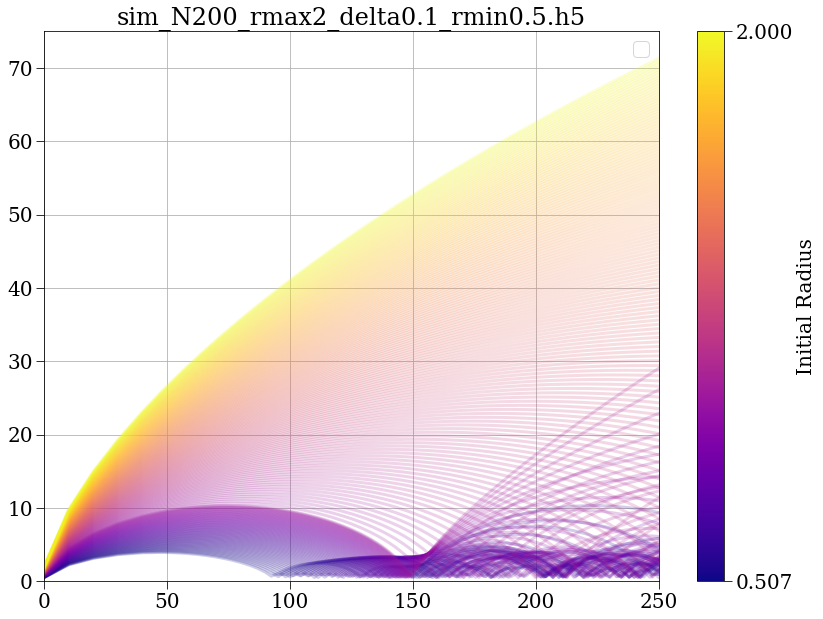

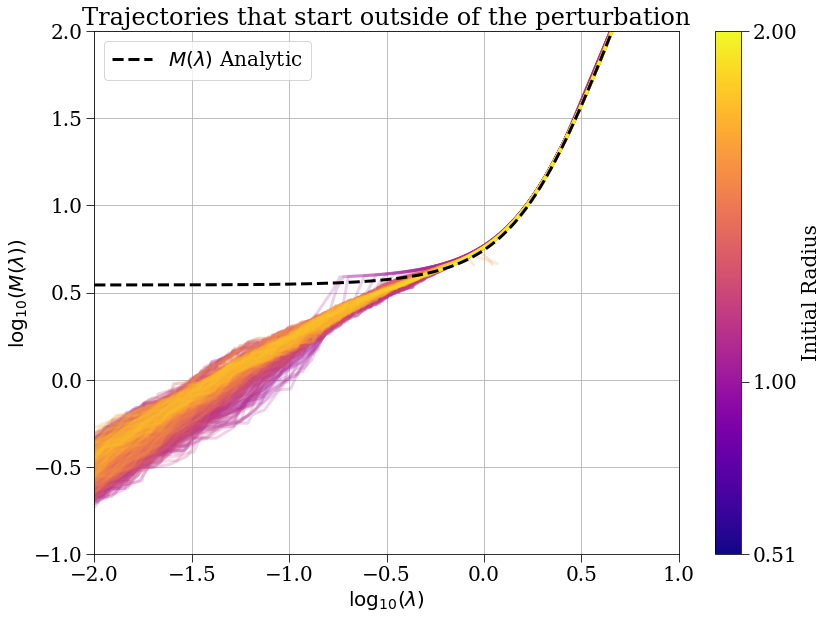

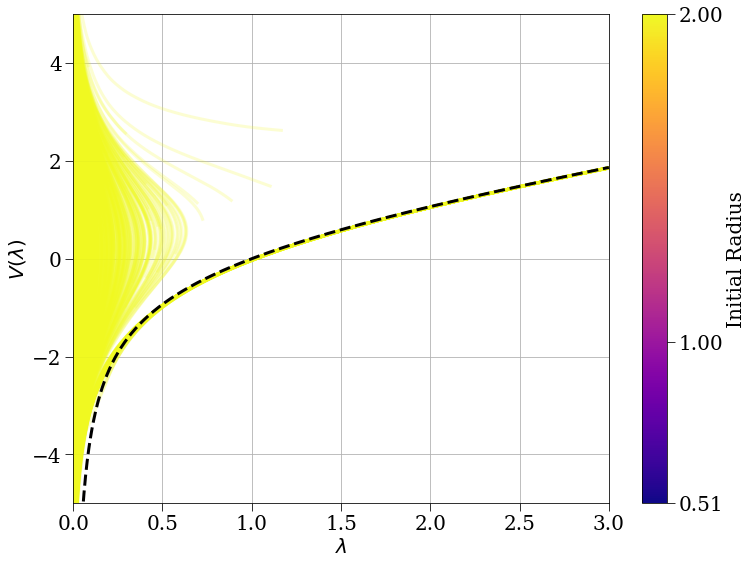

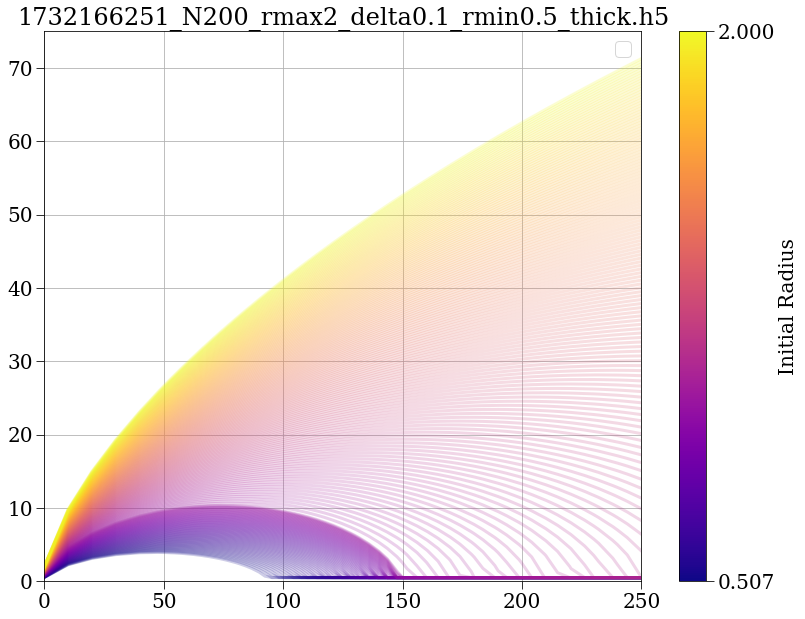

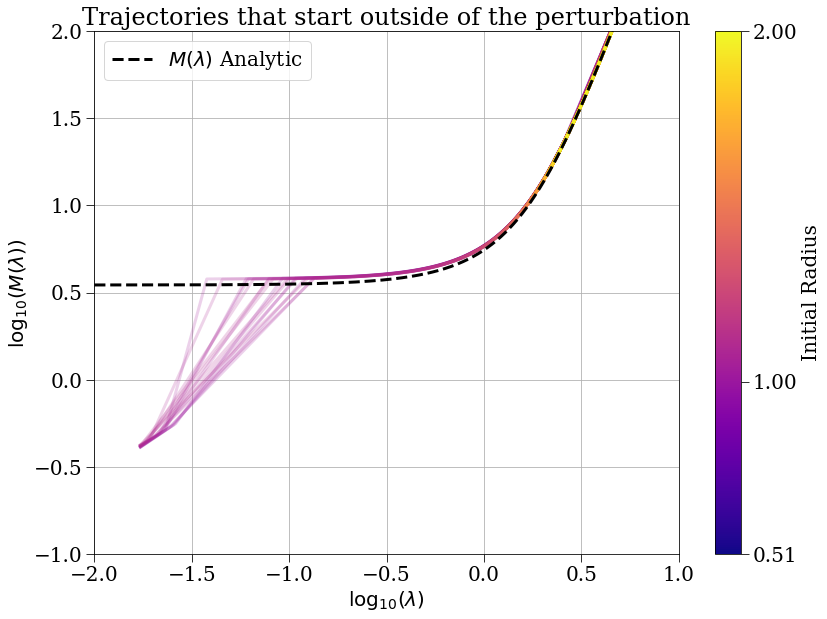

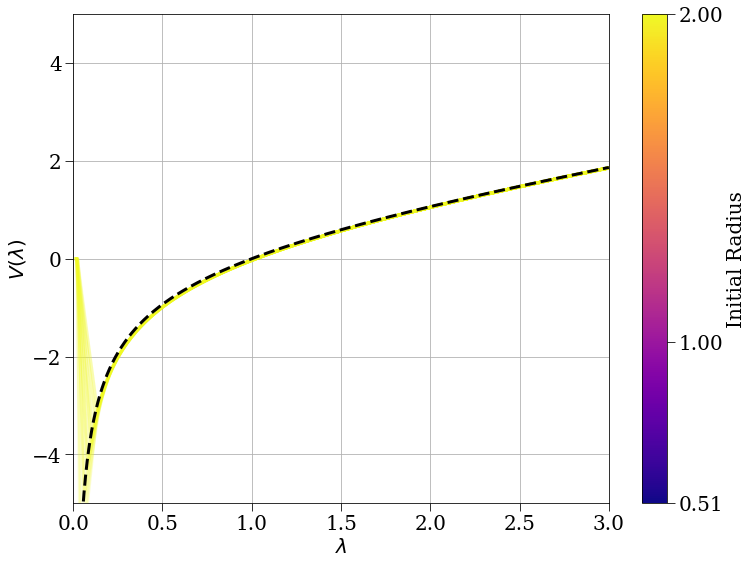

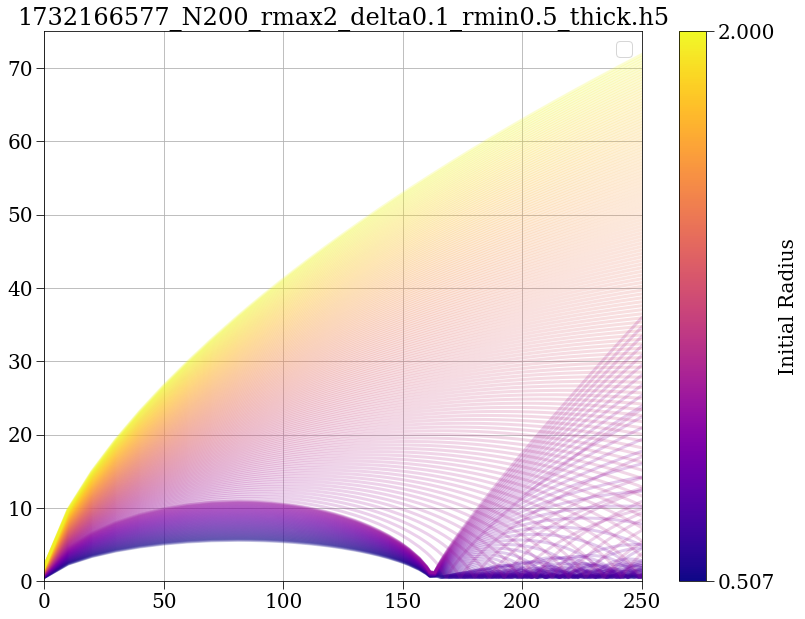

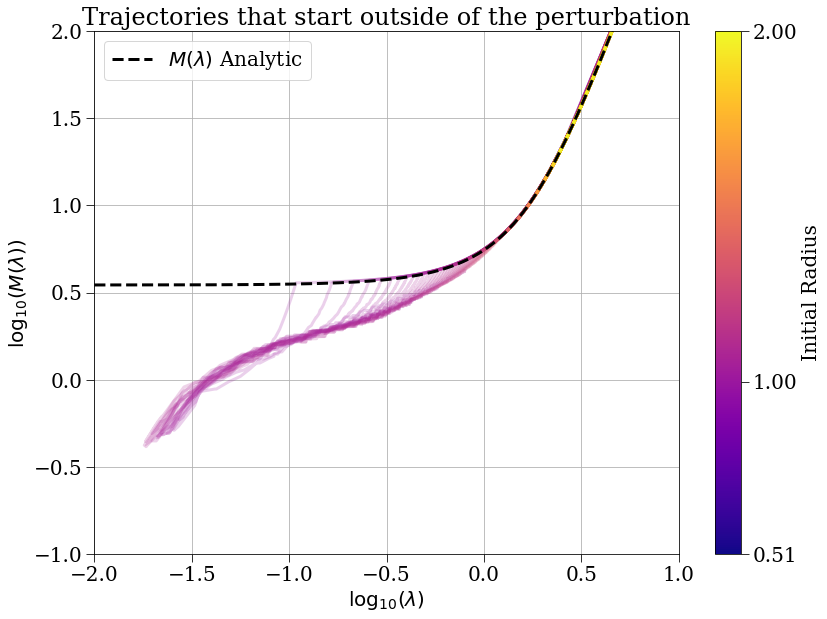

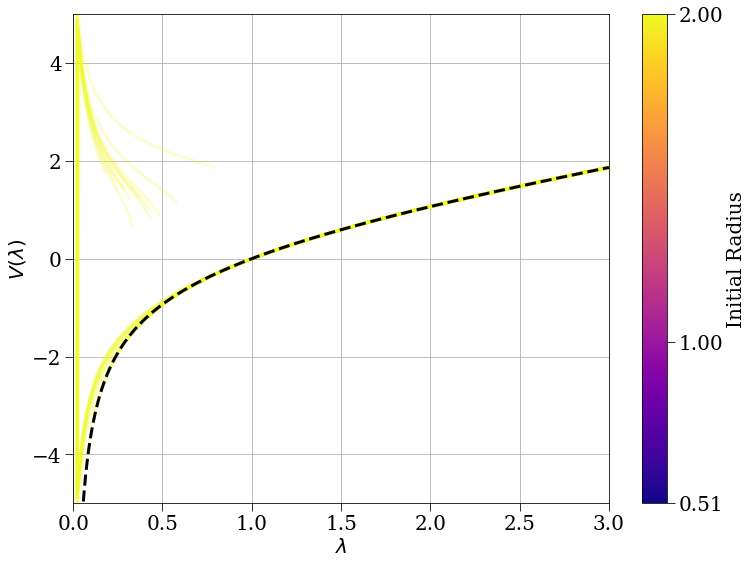

<Figure size 864x648 with 0 Axes>

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
# Assuming load_simulation_data, lambda_rt, m_from_results, m_lambda are defined elsewhere

src_dir = '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/runs'

# Choose a colormap
cmap = plt.cm.plasma 

for file in os.listdir(src_dir):
    if file.endswith('.h5') and "N200" in file and "delta0.1" in file and "rmax2" in file and "rmin0.5" in file:
        print(f"Processing file: {file}")
        file_path = os.path.join(src_dir, file)
        try:
            # Load the simulation data
            params, results = load_simulation_data(file_path)
            tophat_radius = 1
            m_pert = params['m_pert']
            H = 2/3
            G = 1
            N = params['N']

            # Extract initial radii
            initial_radii = results['r'][0, :]  # First time step for all shells
            r_min, r_max = initial_radii.min(), initial_radii.max()
            print(f"Initial Radii: min = {r_min}, max = {r_max}")

            # Define normalization based on initial radii
            norm = plt.Normalize(r_min, r_max)

            # Plot all shells with color based on initial radii
            for idx in range(N):
                t, r = results['t'], results['r'][:, idx]
                r_initial = initial_radii[idx]
                plt.plot(t, r, color=cmap(norm(r_initial)), alpha=0.2)

            # Create ScalarMappable for the colorbar
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, label='Initial Radius')
            cbar.set_ticks([r_min, r_max])

            # Handle legend to avoid duplicate labels
            handles, labels = plt.gca().get_legend_handles_labels()
            by_label = dict(zip(labels, handles))
            plt.legend(by_label.values(), by_label.keys(), loc='best')

            plt.title(file)
            plt.xlim(0,250)
            plt.ylim(0,75)
            plt.tight_layout()

            # --- Second Plot: log10(lambda) vs log10(m_coord) ---
            plt.figure(figsize=(12, 9))
            plt.title("Trajectories that start outside of the perturbation")
            plt.xlabel(r'$\log_{10}(\lambda)$')
            plt.ylabel(r'$\log_{10}(M(\lambda))$')

            for idx in range(N):
                t, r, v, m_enc = results['t'], results['r'][:, idx], results['v'][:, idx], results['m_enc'][:, idx]
                r_initial = initial_radii[idx]
                if r[0] >= tophat_radius:
                    lambda_coord = lambda_rt(r, t, m_pert, H)
                    m_coord = m_from_results(t, m_enc, m_pert, H)
                    plt.plot(np.log10(lambda_coord), np.log10(m_coord), color=cmap(norm(r_initial)), alpha=0.2)

            # Plot the analytic curve
            lambda_vals = np.linspace(1e-2, 10, 1000)
            plt.plot(np.log10(lambda_vals), np.log10(m_lambda(lambda_vals, H)), ls='--', color='k', label=r'$M(\lambda)$ Analytic')

            # Create ScalarMappable for the colorbar
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, label='Initial Radius')
            cbar.set_ticks([r_min, 1, r_max])
            cbar.set_ticklabels([f'{r_min:.2f}', f'{1:.2f}', f'{r_max:.2f}'])

            # Handle legend to avoid duplicate labels
            handles, labels = plt.gca().get_legend_handles_labels()
            by_label = dict(zip(labels, handles))
            plt.legend(by_label.values(), by_label.keys(), loc='best')

            plt.xlim(-2, 1)
            plt.ylim(-1, 2)
            plt.tight_layout()
            plt.figure()

            lambda_vals = np.linspace(1e-4, 3, 1000)
            for idx in range(N):
                t, r, v = results['t'], results['r'][:, idx], results['v'][:, idx]
                if r[0] >= tophat_radius:
                    lambda_coord = lambda_rt(r, t, m_pert, H)
                    v_coord = v * shifted_t(t, t_i) / r_cta(t, m_pert, H)
                    plt.plot(lambda_coord, v_coord, label=f'Shell {idx+1}', color=cmap(norm(r_initial)), alpha=0.2)
            plt.plot(lambda_vals, v_lambda(lambda_vals), ls='--', color='k', label=r'$V(\lambda)$ Analytic')
            plt.xlabel(r'$\lambda$')
            plt.ylabel(r'$V(\lambda)$')
            plt.ylim(-5, 5)
            plt.xlim(0, 3)

            # Create ScalarMappable for the colorbar
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, label='Initial Radius')
            cbar.set_ticks([r_min, 1, r_max])
            cbar.set_ticklabels([f'{r_min:.2f}', f'{1:.2f}', f'{r_max:.2f}'])

            plt.figure()

        except Exception as e:
            print(f"Error processing {file_path}: {e}")

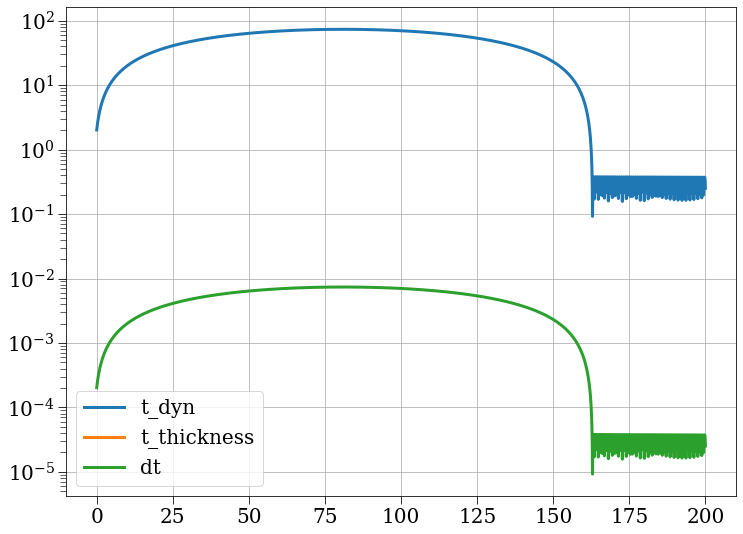

In [13]:
plt.plot(results['t'], results['t_dyn'], label='t_dyn')
plt.plot(results['t'], results['t_thickness'], label='t_thickness')
plt.plot(results['t'], results['dt'], label='dt')
plt.yscale('log')
plt.legend()

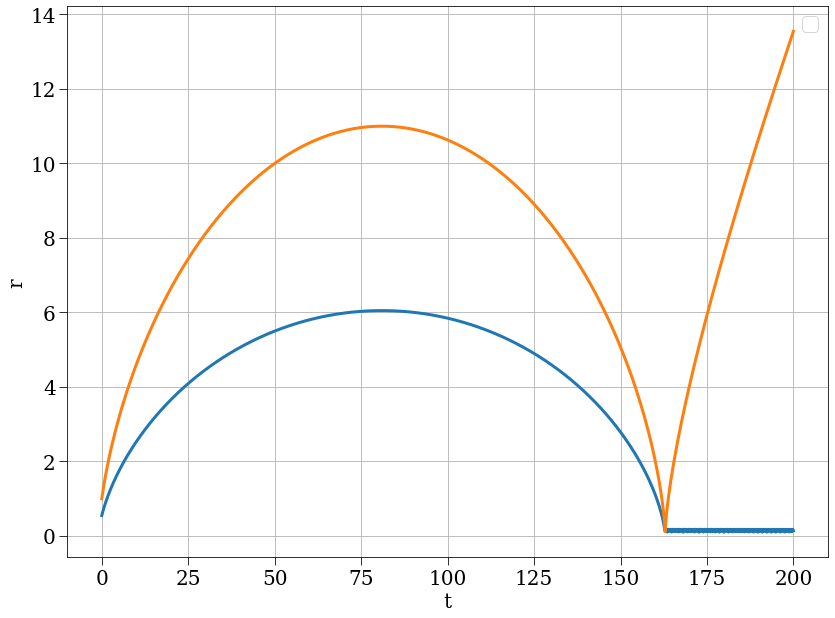

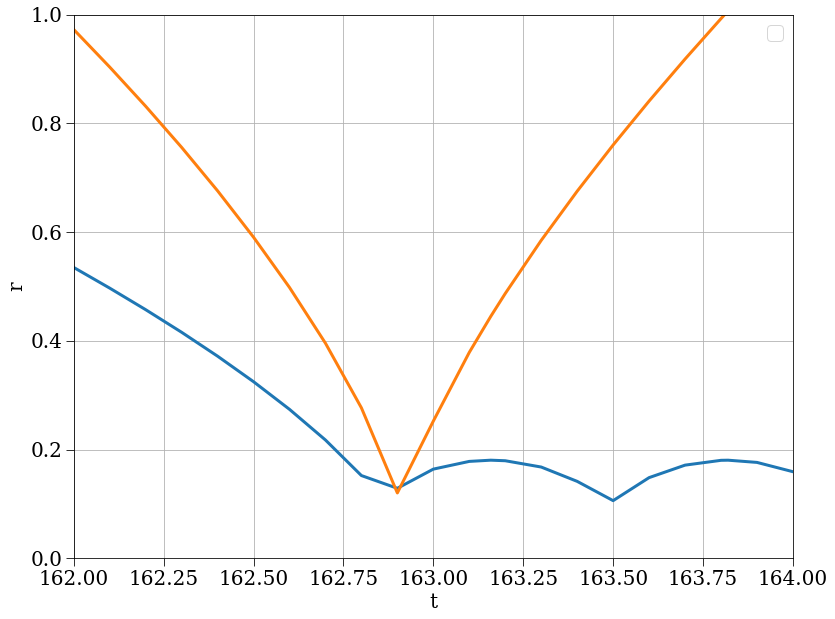

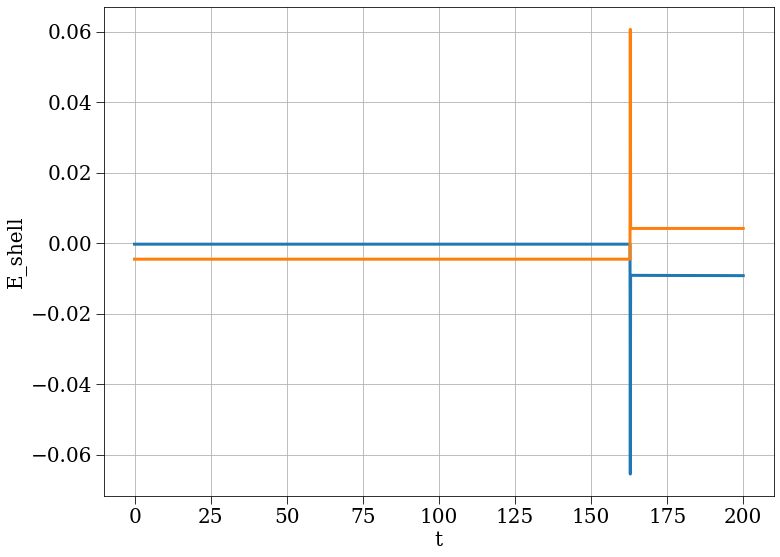

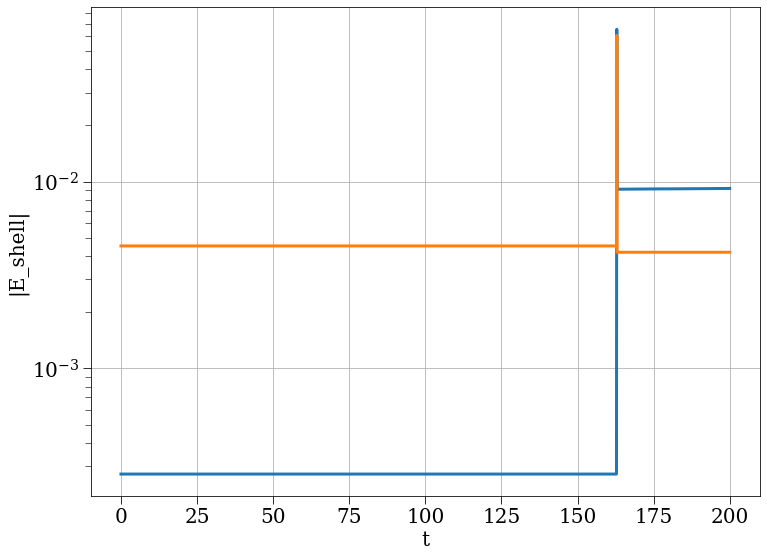

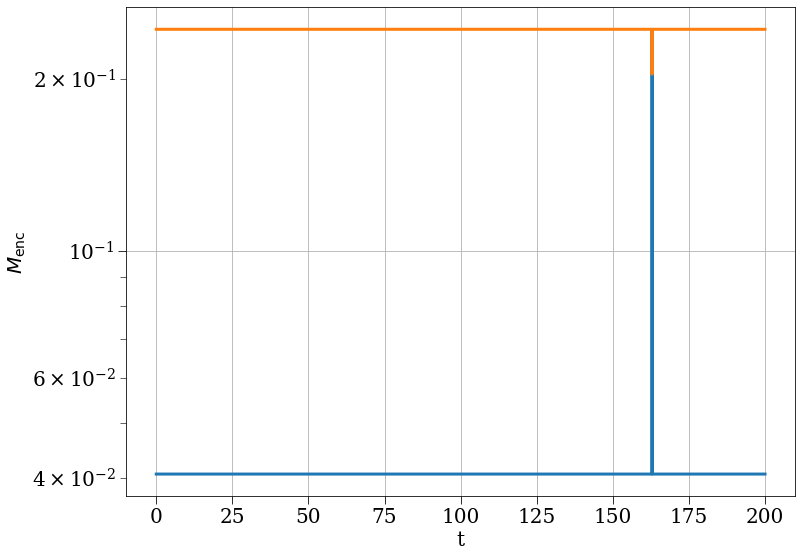

<Figure size 864x648 with 0 Axes>

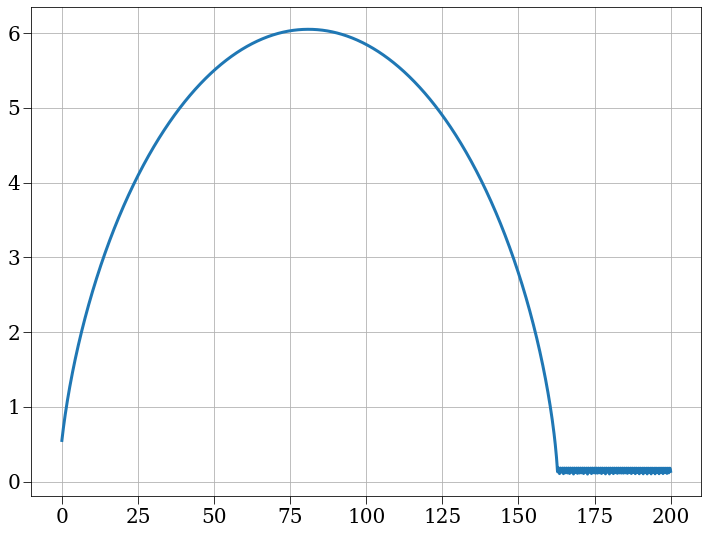

In [14]:
for idx in range(0, N):
    t, r = results['t'], results['r'][:, idx]
    if True:
        plt.plot(t, r, color=f'C{idx}')
    #if r[0] >= tophat_radius:
        #plt.scatter(t_ta(r[0], m_pert, H)-1, r_ta(r[0], m_pert), color=f'C{idx}', s=100, edgecolors='black', linewidths=2)
        # tvals = t_theta(r[0], m_pert, H, theta_vals)
        # rvals = r_theta(r[0], m_pert, theta_vals)
        # plt.plot(tvals, rvals, ls='--', color=f'C{idx}')
#plt.plot(t, r_cta(t, m_pert, H), ls='--', color='k', label=r'$r_{cta}$', zorder=-1)
#plt.legend(fontsize=10)
plt.xlabel('t')
plt.ylabel('r')
#plt.ylim(0, 20_000)
plt.legend()
plt.tight_layout()
#plt.savefig('r_t.pdf')
plt.figure()

for idx in range(0, N):
    t, r = results['t'], results['r'][:, idx]
    if True:
        plt.plot(t, r, color=f'C{idx}')
    #if r[0] >= tophat_radius:
        #plt.scatter(t_ta(r[0], m_pert, H)-1, r_ta(r[0], m_pert), color=f'C{idx}', s=100, edgecolors='black', linewidths=2)
        # tvals = t_theta(r[0], m_pert, H, theta_vals)
        # rvals = r_theta(r[0], m_pert, theta_vals)
        # plt.plot(tvals, rvals, ls='--', color=f'C{idx}')
#plt.plot(t, r_cta(t, m_pert, H), ls='--', color='k', label=r'$r_{cta}$', zorder=-1)
#plt.legend(fontsize=10)
plt.xlabel('t')
plt.ylabel('r')
plt.ylim(0, 1)
plt.xlim(162,164)
plt.legend()
plt.tight_layout()
#plt.savefig('r_t.pdf')


plt.figure()
for idx in range(0, N):
    t, delta_e = results['t'], results['e_tot'][:, idx]
    plt.plot(t, delta_e, label=f'Shell {idx+1}', color=f'C{idx}')
plt.xlabel('t')
plt.ylabel(r'E_shell')
plt.figure()
# e0 = np.sum(results['e_tot'], axis=1)
# plt.plot(results['t'], np.abs(e0[0]-results['e_tot']/e0[0]), label='total')
# plt.xlabel('t')
# plt.ylabel(r'rel energy error')
# plt.figure()
for idx in range(0, N):
    t, delta_e = results['t'], np.abs(results['e_tot'][:, idx])
    plt.plot(t, delta_e, label=f'Shell {idx+1}', color=f'C{idx}')
plt.yscale('log')
plt.xlabel('t')
plt.ylabel(r'|E_shell|')
plt.figure()
for idx in range(0, N):
    t, m_enc = results['t'], results['m_enc'][:, idx]
    plt.plot(t, m_enc, label=f'Shell {idx+1}', color=f'C{idx}')
plt.yscale('log')
plt.xlabel('t')
plt.ylabel(r'$M_{\rm enc}$')
plt.figure()

plt.figure()
for idx in range(1):
    t, r = results['t'], results['r'][:, idx]
    plt.plot(t, r, label=f'Shell {idx+1}', color=f'C{idx}')

In [11]:
def t_turn(m_enc, e_tot, m_shell):
    return np.pi * m_enc / (2*np.abs(e_tot/m_shell))**(3/2)
print(2*t_turn(results['m_enc'][0], results['e_tot'][0], results['m'][0]))
print('----')
print(2/9 * results['r'][0]**3)
print(results['m_enc'][0])
print(2/9 * results['r'][0]**2 * delta_i)
print(np.abs(results['e_tot'][0]/results['m'][0]))


[ 163.73129799  167.23906752  170.80705983  174.43602629  178.12672392
  181.87991538  185.69636901  189.5768588   193.52216448  197.53307146
  201.61037086  205.75485957  209.9673402   214.24862114  218.59951654
  223.02084637  227.51343636  232.0781181   236.71572898  241.42711225
  246.21311702  251.07459826  256.01241682  261.02743948  266.12053889
  271.29259366  276.5444883   281.87711331  287.29136512  292.78814617
  298.36836487  304.03293564  309.78277891  315.61882114  321.54199485
  327.5532386   333.65349702  339.84372082  346.12486682  352.49789794
  358.96378321  365.5234978   372.17802303  378.92834639  385.77546151
  392.72036823  399.76407259  406.90758682  414.15192939  421.49812499
  428.94720459  436.50020538  444.15817084  451.92215074  459.79320116
  467.77238446  475.86076934  484.05943084  492.36945034  500.79191559
  509.3279207   517.97856618  526.74495892  535.62821224  544.62944587
  553.74978596  562.99036514  572.35232248  581.83680352  591.44496029
  601.

In [12]:
# for idx in range(0, N):
#     t, r = results['t'], results['r'][:, idx]
#     plt.plot(t, r, label=f'Shell {idx+1}', color=f'C{idx}')
#     tophat_radius = 0
#     if r[0] >= tophat_radius:
#         plt.scatter(t_ta(r[0], m_pert, H)-1, r_ta(r[0], m_pert), label=f'Shell {idx+1}', color=f'C{idx}', s=100, edgecolors='black', linewidths=2)
#         tvals = t_theta(r[0], m_pert, H, theta_vals)
#         rvals = r_theta(r[0], m_pert, theta_vals)
#         plt.plot(tvals, rvals, ls='--', color=f'C{idx}')
# plt.plot(t, r_cta(t, m_pert, H), ls='--', color='k', label='r_cta', zorder=-1)
# plt.legend(fontsize=10)
# plt.xlabel('t')
# plt.ylabel('r')
# xstart = 0
# xtent = 10
# xend = xstart + xtent
# plt.xlim(xstart, xend)
# #plt.ylim(1e-10, 0.5)
# plt.yscale('log')
# plt.figure()
# for idx in range(0, N):
#     t, delta_e = results['t'], np.abs(results['e_tot'][:, idx])
#     plt.plot(t, delta_e, label=f'Shell {idx+1}', color=f'C{idx}')
# plt.yscale('log')
# plt.xlabel('t')
# plt.ylabel(r'|E_shell|')
# plt.xlim(xstart, xend)
# plt.figure()
# for idx in range(0, N):
#     t, m_enc = results['t'], results['m_enc'][:, idx]
#     plt.plot(t, m_enc, label=f'Shell {idx+1}', color=f'C{idx}')
# plt.yscale('log')
# plt.xlabel('t')
# plt.ylabel(r'$M_{\rm enc}$')
# plt.xlim(xstart, xend)

In [13]:
def r_on_rta(theta):
    return (1-np.cos(theta))/2
def t_on_t_ta(theta):
    return (theta-np.sin(theta))/np.pi
r_on_rta_t = interp1d(t_on_t_ta(theta_vals), r_on_rta(theta_vals), fill_value='extrapolate')

/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log


Text(0, 0.5, '$\\lambda = r/r_{cta}$')

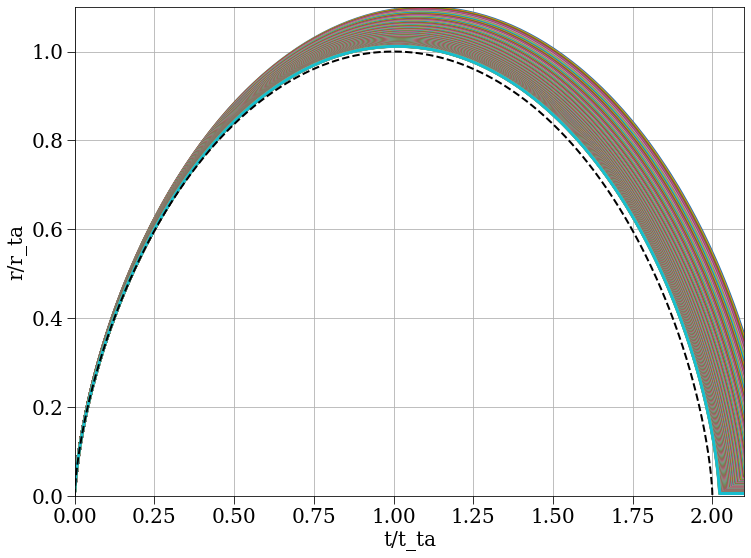

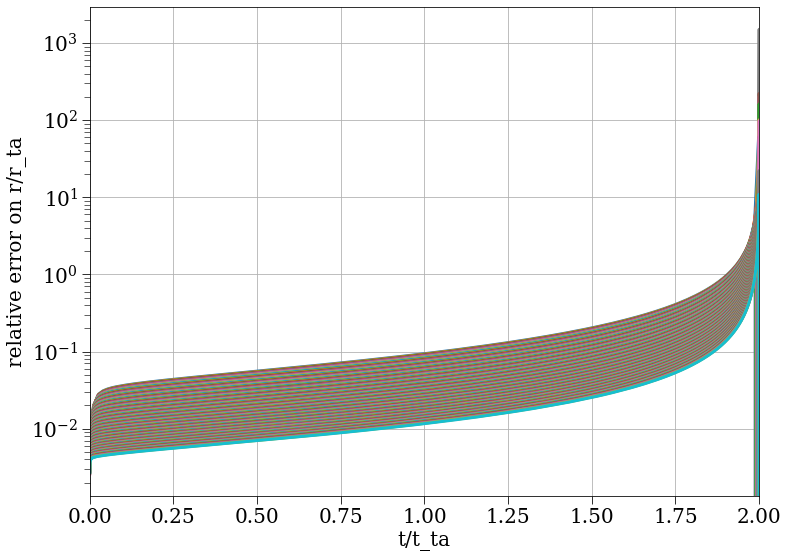

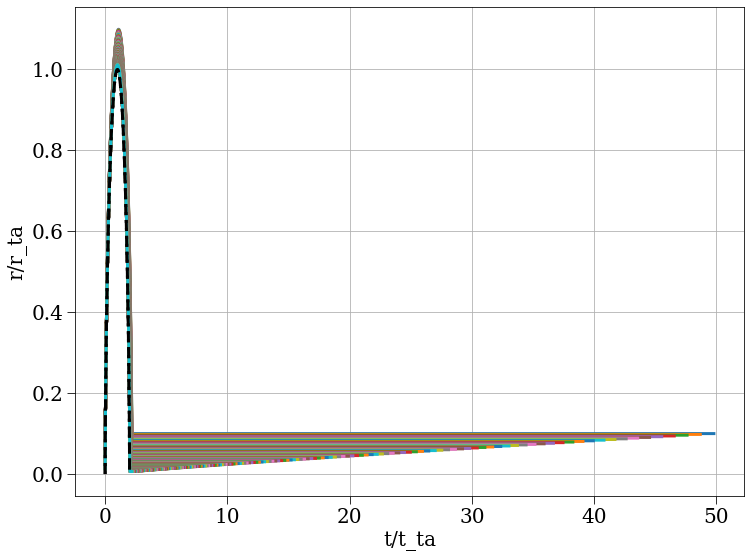

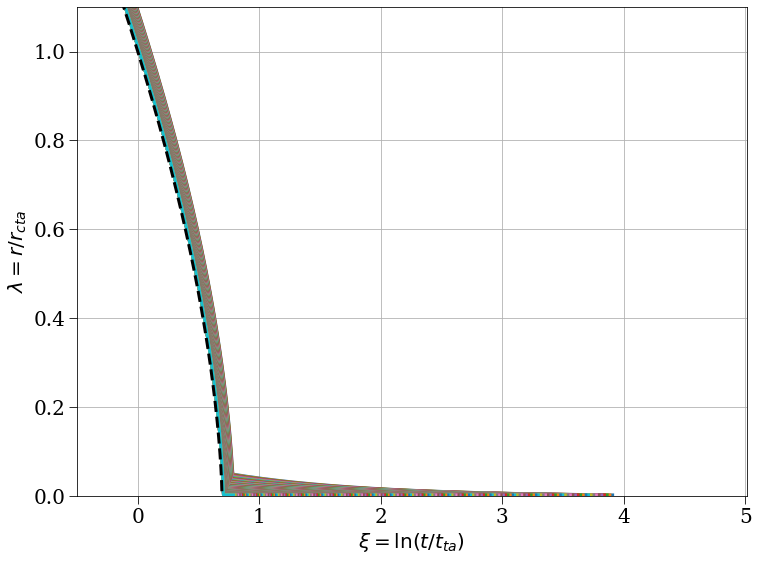

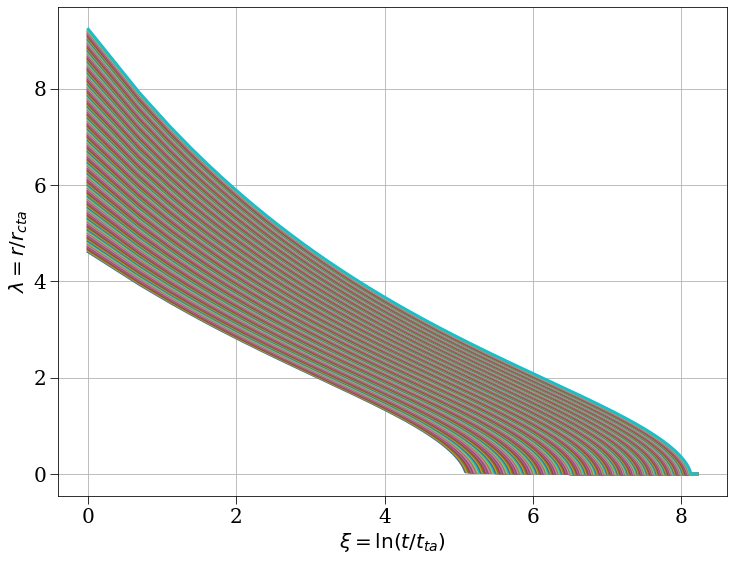

In [14]:
for idx in range(N):
    t, r = results['t'], results['r'][:, idx]
    if r[0] >= tophat_radius:
        plt.plot((t+1)/t_ta(r[0], m_pert, H), r/r_ta(r[0], m_pert), label=f'Shell {idx+1}', color=f'C{idx}')
theta_vals = np.linspace(0, 2*np.pi, 1000)
#plt.plot(t_theta(100, m_pert, H, theta_vals)/t_ta(100, m_pert, H), r_theta(100, m_pert, theta_vals)/r_ta(100, m_pert), ls='--', color='k', label='analytic calculation', lw=2)
plt.plot((theta_vals-np.sin(theta_vals))/(np.pi), (1-np.cos(theta_vals))/2, ls='--', color='k', label='analytic calculation', lw=2)

t_vals = t_theta(100, m_pert, H, theta_vals)/t_ta(100, m_pert, H)
r_an = interp1d(t_vals, r_theta(100, m_pert, theta_vals)/r_ta(100, m_pert), fill_value='extrapolate')
#plt.legend(fontsize=10)
plt.xlabel('t/t_ta')
plt.ylabel('r/r_ta')
plt.ylim(0, 1.1)
plt.xlim(0, 2.1)
plt.figure()
for idx in range(N):
    t, r = results['t'], results['r'][:, idx]
    if r[0] >= tophat_radius:
        t_coord = (t+1)/t_ta(r[0], m_pert, H)
        r_coord = r/r_ta(r[0], m_pert)
        plt.plot(t_coord, np.abs(r_coord-r_on_rta_t(t_coord))/r_on_rta_t(t_coord), label=f'Shell {idx+1}', color=f'C{idx}')
plt.xlim(0, 2)
plt.yscale('log')
#plt.legend(fontsize=10)
plt.xlabel('t/t_ta')
plt.ylabel('relative error on r/r_ta')
plt.figure()
for idx in range(N):
    t, r = results['t'], results['r'][:, idx]
    if r[0] >= tophat_radius:
        plt.plot((t+1)/t_ta(r[0], m_pert, H), r/r_ta(r[0], m_pert), label=f'Shell {idx+1}', color=f'C{idx}')
theta_vals = np.linspace(0, 2*np.pi, 1000)
plt.plot(t_theta(100, m_pert, H, theta_vals)/t_ta(100, m_pert, H), r_theta(100, m_pert, theta_vals)/r_ta(100, m_pert), ls='--', color='k', label='analytic calculation')
plt.plot((theta_vals-np.sin(theta_vals))/(np.pi), (1-np.cos(theta_vals))/2, ls=':', color='k', label='analytic calculation2')

t_vals = t_theta(100, m_pert, H, theta_vals)/t_ta(100, m_pert, H)
r_an = interp1d(t_vals, r_theta(100, m_pert, theta_vals)/r_ta(100, m_pert), fill_value='extrapolate')
#plt.legend(fontsize=10)
plt.xlabel('t/t_ta')
plt.ylabel('r/r_ta')
plt.figure()
for idx in range(N):
    t, r = results['t'], results['r'][:, idx]
    if r[0] >= tophat_radius:
        plt.plot(np.log((t+1)/t_ta(r[0], m_pert, H)), lambda_rt(r, t, m_pert, H), label=f'Shell {idx+1}', color=f'C{idx}')
theta_vals = np.linspace(0, 2*np.pi, 1000)
plt.plot(np.log((theta_vals-np.sin(theta_vals))/(np.pi)), lambda_theta(theta_vals), ls='--', color='k', label='analytic calculation2')

t_vals = t_theta(100, m_pert, H, theta_vals)/t_ta(100, m_pert, H)
r_an = interp1d(t_vals, r_theta(100, m_pert, theta_vals)/r_ta(100, m_pert), fill_value='extrapolate')
#plt.legend(fontsize=10)
plt.xlabel(r'$\xi = \ln(t/t_{ta})$')
plt.ylabel(r'$\lambda = r/r_{cta}$')
plt.xlim(-0.5, None)
plt.ylim(0, 1.1)
plt.figure()
for idx in range(N):
    t, r = results['t'], results['r'][:, idx]
    if r[0] >= tophat_radius:
        plt.plot(np.log((t+1)), lambda_rt(r, t, m_pert, H), label=f'Shell {idx+1}', color=f'C{idx}')
theta_vals = np.linspace(0, 2*np.pi, 1000)
#plt.plot(np.log((theta_vals-np.sin(theta_vals))/(np.pi)), lambda_theta(theta_vals), ls='--', color='k', label='analytic calculation2')

#t_vals = t_theta(100, m_pert, H, theta_vals)/t_ta(100, m_pert, H)
#r_an = interp1d(t_vals, r_theta(100, m_pert, theta_vals)/r_ta(100, m_pert), fill_value='extrapolate')
#plt.legend(fontsize=10)
plt.xlabel(r'$\xi = \ln(t/t_{ta})$')
plt.ylabel(r'$\lambda = r/r_{cta}$')
#plt.xlim(-0.5, None)
#plt.ylim(0, 1.1)

<Figure size 864x648 with 0 Axes>

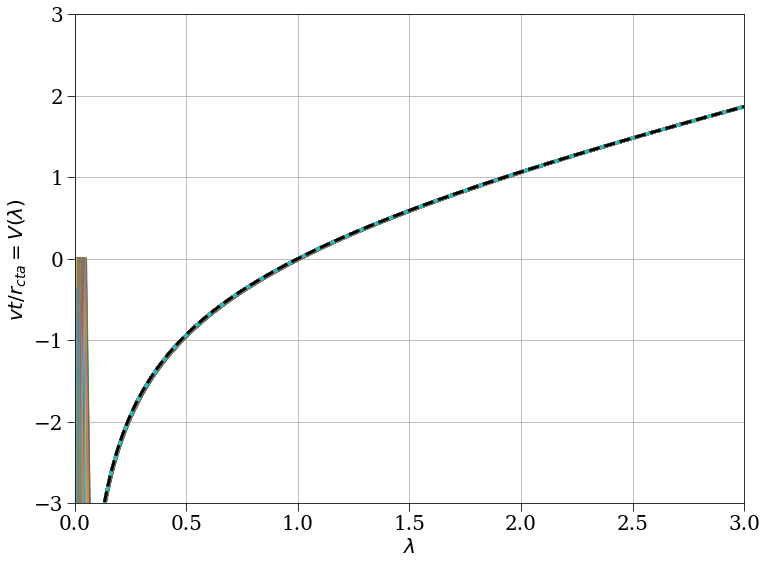

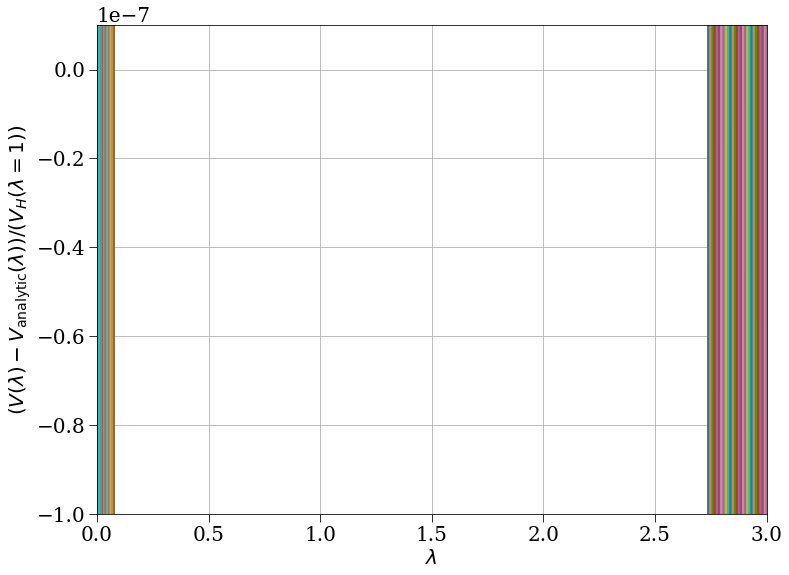

<Figure size 864x648 with 0 Axes>

In [15]:
lambda_vals = np.linspace(1e-4, 3, 1000)
for idx in range(N):
    t, r, v = results['t'], results['r'][:, idx], results['v'][:, idx]
    if r[0] >= tophat_radius:
        lambda_coord = lambda_rt(r, t, m_pert, H)
        v_coord = v * shifted_t(t, t_i) / r_cta(t, m_pert, H)
        plt.plot(lambda_coord, v_coord, label=f'Shell {idx+1}', color=f'C{idx}')
plt.plot(lambda_vals, v_lambda(lambda_vals), ls='--', color='k', label='v_lambda')
#plt.legend(fontsize=10)
plt.xlabel(r'$\lambda$')
plt.ylabel(r'$v t / r_{cta} = V(\lambda)$')
plt.ylim(-3, 3)
plt.xlim(0, 3)
plt.figure()

def v_H_lambda(lambda_val, H, t):
    return H * lambda_val * (t+1)

for idx in range(N):
    t, r, v = results['t'], results['r'][:, idx], results['v'][:, idx]
    if r[0] >= tophat_radius or True:
        lambda_coord = lambda_rt(r, t, m_pert, H)
        v_coord = v * shifted_t(t, t_i) / r_cta(t, m_pert, H)
        plt.plot(lambda_coord, (v_coord-v_lambda(lambda_coord))/(v_H_lambda(1,H,t)), label=f'Shell {idx+1}', color=f'C{idx}')
#plt.legend(fontsize=10)
plt.xlabel(r'$\lambda$')
plt.ylabel(r'$(V(\lambda) - V_{\rm analytic}(\lambda))/(V_{H}(\lambda=1))$')
plt.ylim(-1e-7, 1e-8)
plt.xlim(0, 3)
plt.figure()

(0.0, 0.001)

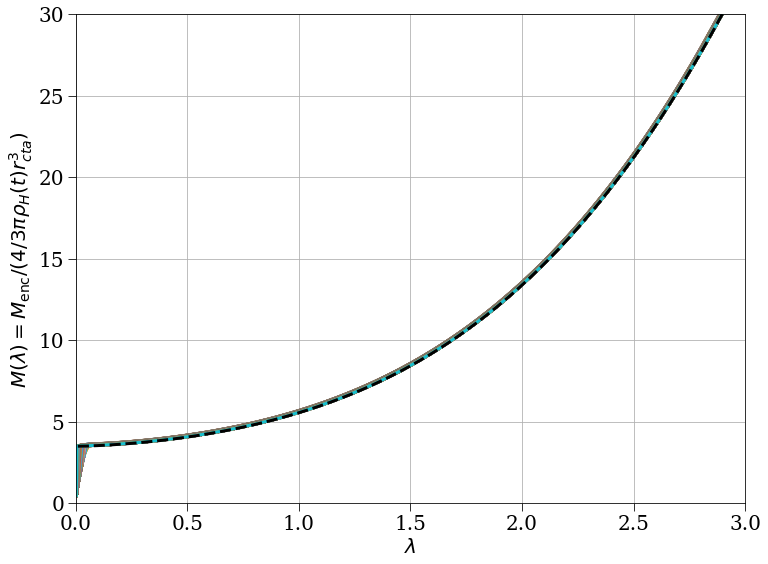

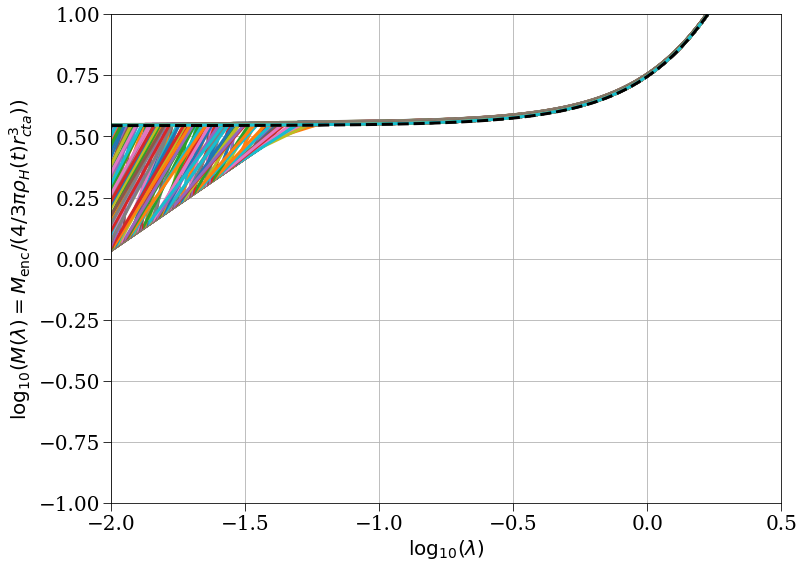

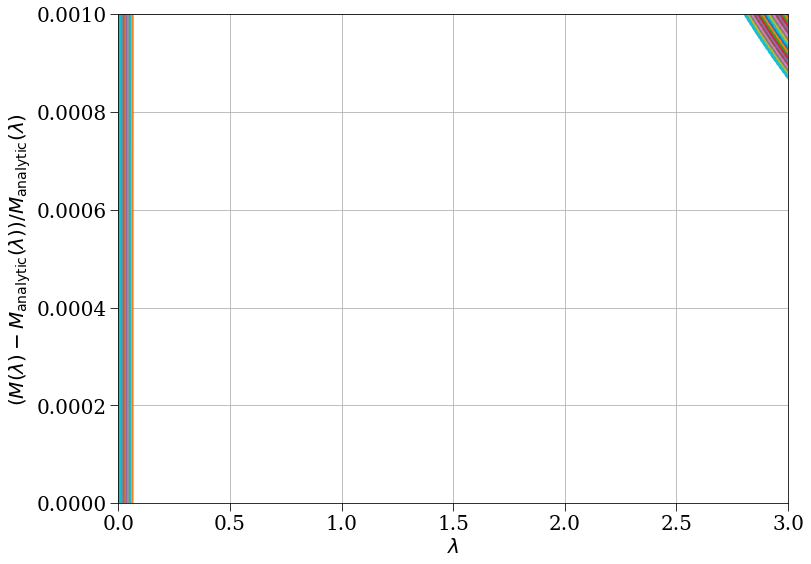

In [16]:
lambda_vals = np.linspace(1e-2, 3, 1000)
for idx in range(0, N):
    t, r, v, m_enc = results['t'], results['r'][:, idx], results['v'][:, idx], results['m_enc'][:, idx]
    if r[0] >= tophat_radius:
        lambda_coord = lambda_rt(r, t, m_pert, H)
        m_coord = m_from_results(t, m_enc, m_pert, H)
        plt.plot(lambda_coord, m_coord, label=f'Shell {idx+1}', color=f'C{idx}')
plt.plot(lambda_vals, m_lambda(lambda_vals, H), ls='--', color='k', label='m_lambda')
#plt.legend(fontsize=10)
plt.xlabel(r'$\lambda$')
plt.ylabel(r'$M(\lambda) = M_{\rm enc} / (4/3 \pi \rho_H(t) r_{cta}^3)$')
plt.xlim(0, 3)
plt.ylim(0, 30)
plt.figure()


# real_m_enc = np.empty_like(results['m_enc'])
# for i in range(len(results['t'])):
#     sorted_indices = np.argsort(results['r'][i])
#     sorted_masses = results['m'][i][sorted_indices]
#     cumulative_mass = np.cumsum(sorted_masses)
#     real_m_enc[i][sorted_indices] = cumulative_mass + point_mass

for idx in range(0,N):
    t, r, v, m_enc = results['t'], results['r'][:, idx], results['v'][:, idx], results['m_enc'][:, idx]
    if r[0] >= tophat_radius:
        lambda_coord = lambda_rt(r, t, m_pert, H)
        m_coord = m_from_results(t, m_enc, m_pert, H)
        plt.plot(np.log10(lambda_coord), np.log10(m_coord), label=f'Shell {idx+1}', color=f'C{idx}')
plt.plot(np.log10(lambda_vals), np.log10(m_lambda(lambda_vals, H)), ls='--', color='k', label='m_lambda')
#plt.legend(fontsize=10)
plt.xlabel(r'$\log_{10}(\lambda)$')
plt.ylabel(r'$\log_{10}(M(\lambda) = M_{\rm enc} / (4/3 \pi \rho_H(t) r_{cta}^3))$')
plt.xlim(-2, 0.5)
plt.ylim(-1, 1)
plt.figure()


for idx in range(0, N):
    t, r, v, m_enc = results['t'], results['r'][:, idx], results['v'][:, idx], results['m_enc'][:, idx]

    if r[0] >= tophat_radius:
        lambda_coord = lambda_rt(r, t, m_pert, H)
        m_coord = m_from_results(t, m_enc, m_pert, H)
        m_exact = m_lambda(lambda_coord, H)
        plt.plot(lambda_coord, (m_coord-m_exact)/m_exact, label=f'Shell {idx+1}', color=f'C{idx}')
#plt.legend(fontsize=10)
plt.xlabel(r'$\lambda$')
plt.ylabel(r'$(M(\lambda)-M_{\rm analytic}(\lambda)) / M_{\rm analytic}(\lambda)$')
plt.xlim(0, 3)
plt.ylim(0, 1e-3)

/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encou

(-1.0, 3.0)

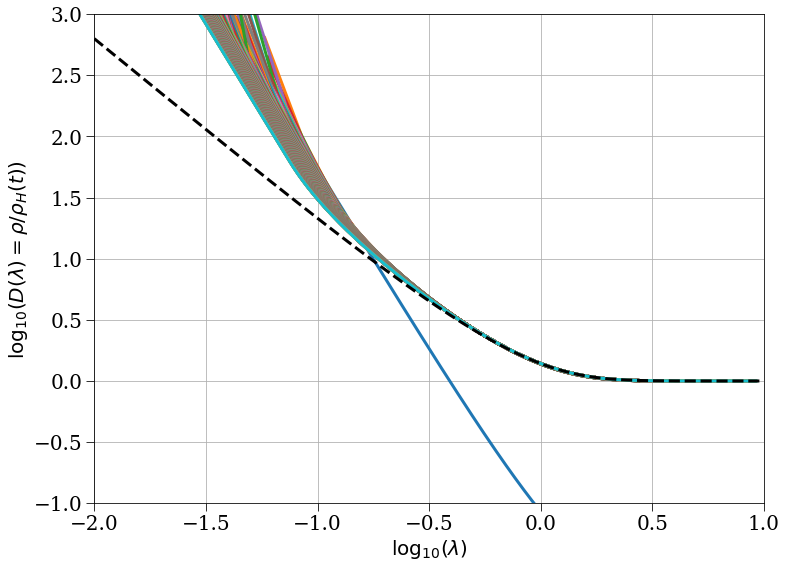

In [17]:
lambda_vals = np.linspace(1e-2, 10, 1000)
for idx in range(N):
    t, r, v, m_enc, m_shell, r_below = results['t'], results['r'][:, idx], results['v'][:, idx], results['m_enc'][:, idx], results['m'][:, idx], results['r'][:, idx-1]
    if idx == 0:
        r_below = 0
    if r[0] >= tophat_radius:
        lambda_coord = lambda_rt(r, t, m_pert, H)
        d_coord = d_from_results(t, m_shell, r, r_below)
        plt.plot(np.log10(lambda_coord), np.log10(d_coord), label=f'Shell {idx+1}', color=f'C{idx}')
plt.plot(np.log10(lambda_vals), np.log10(d_lambda(lambda_vals, H)), ls='--', color='k', label='d_lambda')
#plt.legend(fontsize=10)
plt.xlabel(r'$\log_{10}(\lambda)$')
plt.ylabel(r'$\log_{10}(D(\lambda) = \rho/\rho_H(t))$')
plt.xlim(-2, 1)
plt.ylim(-1, 3)

In [26]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt


def gravitational_system(xi, y):
    """
    Convert 2nd order ODE to system of 1st order ODEs
    y[0] = λ
    y[1] = dλ/dξ
    """
    lambda_val, dlambda = y
    
    # Ensure lambda stays positive
    #lambda_val = np.maximum(lambda_val, 1e-10)
    
    # Original equation: d²λ/dξ² + (7/9)(dλ/dξ) + 8/81 = -(2/9)M(λ)/λ²
    j_squared = 1e-4
    d2lambda = -(7/9) * dlambda - 8/81 - (2/9) * m_lambda(lambda_val, H) / (lambda_val**2) + j_squared / lambda_val**3
    
    # # Add a repulsive term at very small λ to prevent collapse to zero
    # if lambda_val < 0.01:
    #     d2lambda += 0.1 / (lambda_val**3)
    
    return [dlambda, d2lambda]

# ... existing imports and function definitions ...

# Initial conditions at xi=0
xi_0 = 0
lambda_0 = 1.0
dlambda_0 = -8/9
y0 = [lambda_0, dlambda_0]

method = 'DOP853'
tol = 1e-16

backwards = False  # Flag to control backward integration and plotting

# Forward integration (positive time direction)
solution_forward = solve_ivp(
    gravitational_system,
    [0, 3],  # Forward from 0 to 3
    y0,
    method=method,
    rtol=tol,
    atol=tol,
    dense_output=True,
    events=lambda t, y: y[1]
)

# Generate smooth output for forward solution
xi_forward = np.linspace(0, 3, 500)
y_forward = solution_forward.sol(xi_forward)

# Plot lambda for forward direction
plt.figure(figsize=(10, 6))
plt.plot(xi_forward, y_forward[0], 'g-', label='λ(ξ) forward', lw=1)
plt.grid(True)
plt.xlabel('ξ')
plt.ylabel('λ')
plt.title('Gravitational Collapse Solution - λ(ξ)')
plt.legend()
plt.ylim(0, 1)
plt.xlim(0, 3)

# Plot derivative of lambda for forward direction
plt.figure(figsize=(10, 6))
plt.plot(xi_forward, y_forward[1], 'm--', label='dλ/dξ forward')
plt.grid(True)
plt.xlabel('ξ')
plt.ylabel('dλ/dξ')
plt.title('Gravitational Collapse Solution - dλ/dξ')
plt.legend()
plt.show()

# Print some key values for forward direction
print("\nSolution statistics:")
print(f"Forward integration steps: {solution_forward.nfev}")
print(f"Final forward λ value: {y_forward[0][-1]:.6f}")

if backwards:
    # Backward integration (negative time direction)
    solution_backward = solve_ivp(
        gravitational_system,
        [0, -5],  # Backward from 0 to -5
        y0,
        method=method,
        rtol=tol,
        atol=tol,
        dense_output=True
    )

    # Generate smooth output for backward solution
    xi_backward = np.linspace(-5, 0, 500)
    y_backward = solution_backward.sol(xi_backward)

    # Plot lambda
    plt.figure(figsize=(10, 6))
    plt.plot(xi_backward, y_backward[0], 'b-', label='λ(ξ) backward', lw=1)
    plt.grid(True)
    plt.xlabel('ξ')
    plt.ylabel('λ')
    plt.title('Gravitational Collapse Solution - λ(ξ)')
    plt.legend()
    plt.ylim(0, 1)
    plt.xlim(-5, 0)

    # Plot derivative of lambda
    plt.figure(figsize=(10, 6))
    plt.plot(xi_backward, y_backward[1], 'r--', label='dλ/dξ backward')
    plt.grid(True)
    plt.xlabel('ξ')
    plt.ylabel('dλ/dξ')
    plt.title('Gravitational Collapse Solution - dλ/dξ')
    plt.legend()
    plt.show()

    # Print some key values
    print("\nSolution statistics:")
    print(f"Backward integration steps: {solution_backward.nfev}")
    print(f"Final backward λ value: {y_backward[0][0]:.6f}")

/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/scipy/integrate/_ivp/common.py:46: UserWarning: `rtol` is too low, setting to 2.220446049250313e-14
  warn("`rtol` is too low, setting to {}".format(100 * EPS))


KeyboardInterrupt: 

(1.0, 10.0)

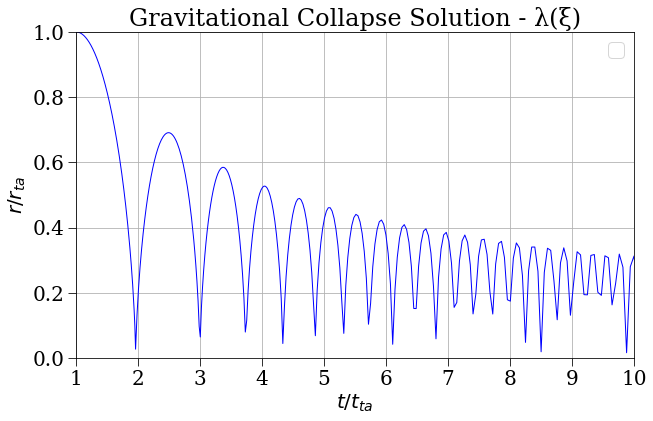

In [22]:
plt.figure(figsize=(10, 6))
plt.plot(np.exp(xi_forward), y_forward[0]*np.exp((8/9)*xi_forward), 'b-', lw=1)
plt.grid(True)
plt.xlabel(r'$t/t_{ta}$')
plt.ylabel(r'$r/r_{ta}$')
plt.title('Gravitational Collapse Solution - λ(ξ)')
plt.legend()
plt.ylim(0,1)
plt.xlim(1, 10)

(4500.0, 20000.0)

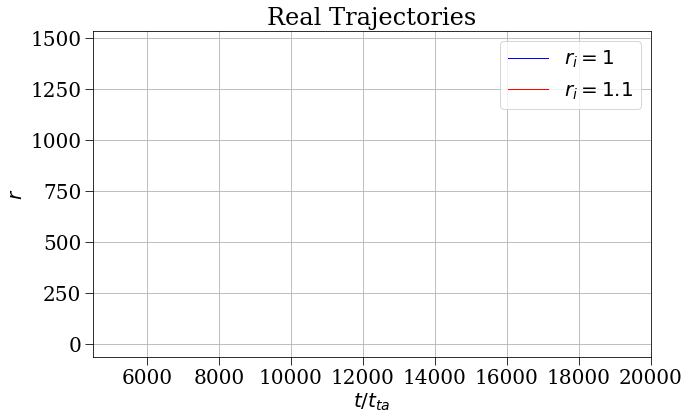

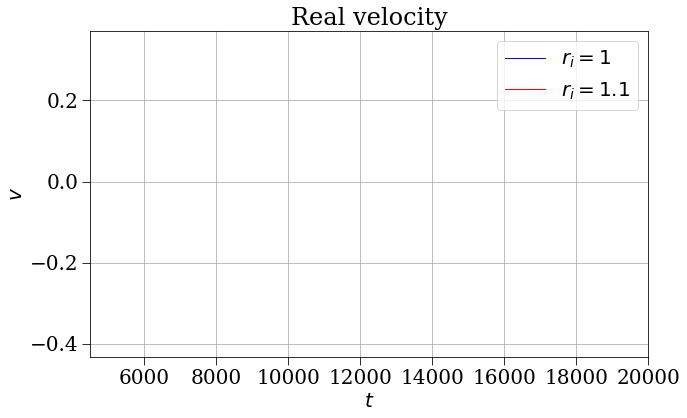

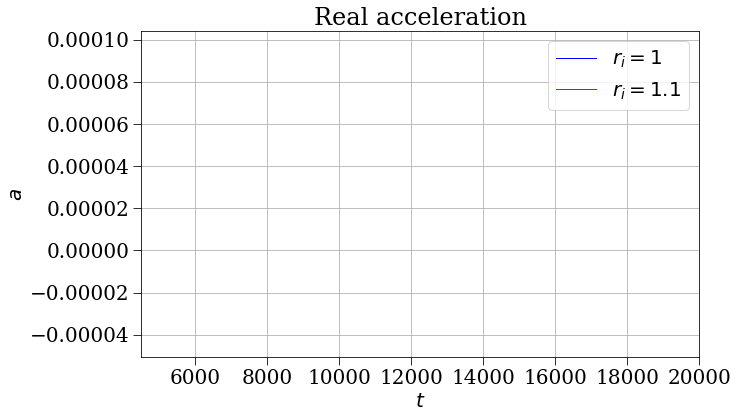

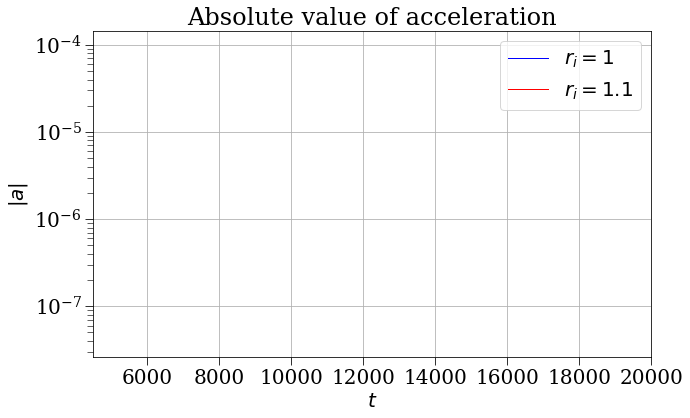

In [23]:
plt.figure(figsize=(10, 6))
ri1, ri2 = 1, 1.1
def t_from_results(xi, ri, m_pert=m_pert, H=H):
    return (np.exp(xi)+1)*t_ta(ri, m_pert, H)
def r_from_results(xi, lam, ri, m_pert=m_pert, H=H):
    return lam*np.exp((8/9)*xi)*r_ta(ri, m_pert)
def v_from_results(xi, lam, dlam, ri, m_pert=m_pert, H=H):
    return r_cta(t_from_results(xi, ri), m_pert, H) / t_from_results(xi, ri) * (dlam + 8/9 * lam)
def a_from_results(t, v):
    return np.gradient(v, t)


t1 = t_from_results(xi_forward, ri1)
t2 = t_from_results(xi_forward, ri2)
r1 = r_from_results(xi_forward, y_forward[0], ri1)
r2 = r_from_results(xi_forward, y_forward[0], ri2)
v1 = v_from_results(xi_forward, y_forward[0], y_forward[1], ri1)
v2 = v_from_results(xi_forward, y_forward[0], y_forward[1], ri2)
a1 = a_from_results(t1, v1)
a2 = a_from_results(t2, v2)

plt.plot(t1, r1, 'b-', lw=1, label=fr'$r_i = {ri1}$')
plt.plot(t2, r2, 'r-', lw=1, label=fr'$r_i = {ri2}$')
plt.grid(True)
plt.xlabel(r'$t/t_{ta}$')
plt.ylabel(r'$r$')
plt.title('Real Trajectories')
plt.legend()
#plt.ylim(0,100)
plt.xlim(4_500, 20_000)
plt.figure(figsize=(10, 6))
plt.plot(t1, v1, 'b-', lw=1, label=fr'$r_i = {ri1}$')
plt.plot(t2, v2, 'r-', lw=1, label=fr'$r_i = {ri2}$')
plt.grid(True)
plt.xlabel(r'$t$')
plt.ylabel(r'$v$')
plt.title('Real velocity')
plt.legend()
#plt.ylim(0,100)
plt.xlim(4_500, 20_000)
plt.figure(figsize=(10, 6))
plt.plot(t1, a1, 'b-', lw=1, label=fr'$r_i = {ri1}$')
plt.plot(t2, a2, 'r-', lw=1, label=fr'$r_i = {ri2}$')
plt.grid(True)
plt.xlabel(r'$t$')
plt.ylabel(r'$a$')
plt.title('Real acceleration')
plt.legend()
#plt.ylim(0,100)
plt.xlim(4_500, 20_000)
plt.figure(figsize=(10, 6))
plt.plot(t1, np.abs(a1), 'b-', lw=1, label=fr'$r_i = {ri1}$')
plt.plot(t2, np.abs(a2), 'r-', lw=1, label=fr'$r_i = {ri2}$')
plt.grid(True)
plt.xlabel(r'$t$')
plt.ylabel(r'$|a|$')
plt.title('Absolute value of acceleration')
plt.legend()
plt.yscale('log')
#plt.ylim(0,100)
plt.xlim(4_500, 20_000)

<Figure size 720x432 with 0 Axes>

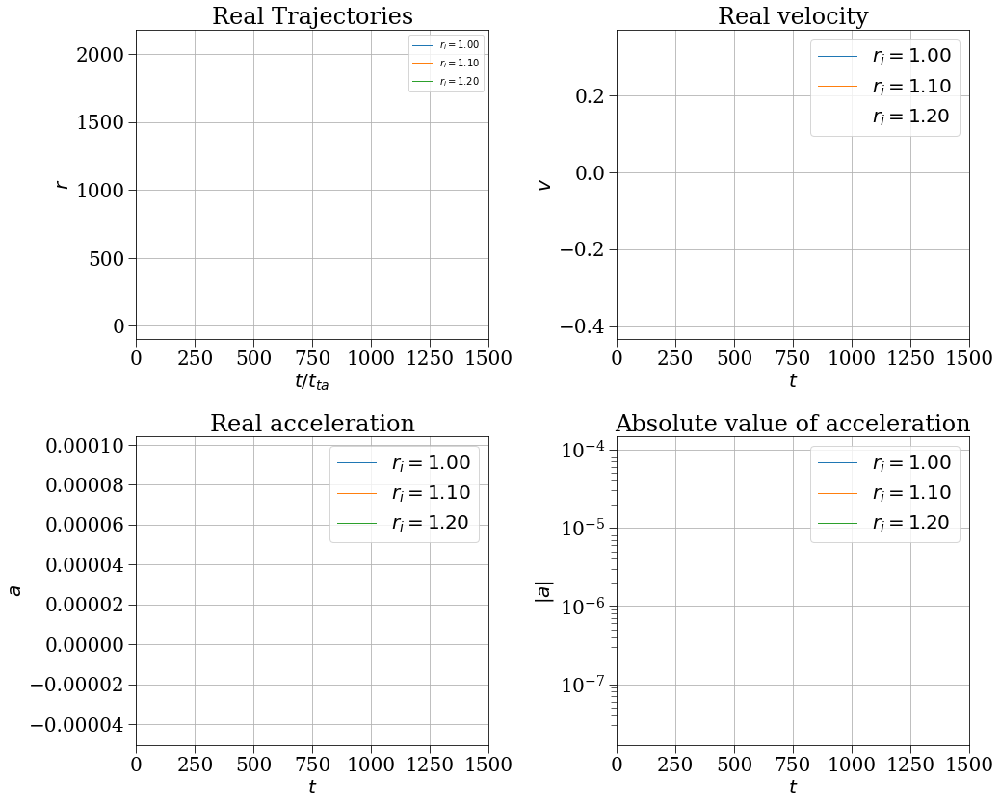

In [24]:
plt.figure(figsize=(10, 6))

# Define list of initial radii
ris = np.linspace(1.0, 1.2, 3)  # Adjust range and number of radii as needed

# Helper functions (unchanged)
def t_from_results(xi, ri, m_pert=m_pert, H=H):
    return (np.exp(xi)+1)*t_ta(ri, m_pert, H)

def r_from_results(xi, lam, ri, m_pert=m_pert, H=H):
    return lam*np.exp((8/9)*xi)*r_ta(ri, m_pert)

def v_from_results(xi, lam, dlam, ri, m_pert=m_pert, H=H):
    return r_cta(t_from_results(xi, ri), m_pert, H) / t_from_results(xi, ri) * (dlam + 8/9 * lam)

def a_from_results(t, v):
    return np.gradient(v, t)

# Calculate and plot for each ri
results = []
for ri in ris:
    # Calculate trajectories
    t = t_from_results(xi_forward, ri)
    r = r_from_results(xi_forward, y_forward[0], ri)
    v = v_from_results(xi_forward, y_forward[0], y_forward[1], ri)
    a = a_from_results(t, v)
    
    results.append({
        't': t,
        'r': r,
        'v': v,
        'a': a
    })
    
# Plot trajectories
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
xlims = (0, 1500)

for i, ri in enumerate(ris):
    color = f'C{i}'
    label = fr'$r_i = {ri:.2f}$'
    
    # Position
    ax1.plot(results[i]['t'], results[i]['r'], color=color, lw=1, label=label)
    ax1.set_xlabel(r'$t/t_{ta}$')
    ax1.set_ylabel(r'$r$')
    ax1.set_title('Real Trajectories')
    ax1.grid(True)
    ax1.set_xlim(*xlims)
    ax1.legend(fontsize=10)
    
    # Velocity
    ax2.plot(results[i]['t'], results[i]['v'], color=color, lw=1, label=label)
    ax2.set_xlabel(r'$t$')
    ax2.set_ylabel(r'$v$')
    ax2.set_title('Real velocity')
    ax2.grid(True)
    ax2.set_xlim(*xlims)
    ax2.legend()
    
    # Acceleration
    ax3.plot(results[i]['t'], results[i]['a'], color=color, lw=1, label=label)
    ax3.set_xlabel(r'$t$')
    ax3.set_ylabel(r'$a$')
    ax3.set_title('Real acceleration')
    ax3.grid(True)
    ax3.set_xlim(*xlims)
    ax3.legend()
    
    # Absolute acceleration
    ax4.plot(results[i]['t'], np.abs(results[i]['a']), color=color, lw=1, label=label)
    ax4.set_xlabel(r'$t$')
    ax4.set_ylabel(r'$|a|$')
    ax4.set_title('Absolute value of acceleration')
    ax4.set_yscale('log')
    ax4.grid(True)
    ax4.set_xlim(*xlims)
    ax4.legend()

plt.tight_layout()